In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
from datetime import timedelta
from datetime import datetime as dt
from matplotlib.ticker import FuncFormatter
%matplotlib inline

In [2]:
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 9),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

# Load data

### Errors encountered when loading in data:

- **ParserError**: Error tokenizing data. C error: Expected 13 fields in line 30, saw 14

 Reason: <br>
 - The were erroneous values such as 'Moccasins & Boat Shoes' in the `order_created_at` column, and as a result shifted the data for the `order_created_at` and `order_status` columns to the right by 1 column, resulting in 14 columns.

 - This 14th column had a blank header, which resulted in ParserError.

 Solution: <br>
 - Specify a list of 14 column names before reading in csv; extra column named as 'error'.<br><br>

- **UnicodeDecodeError**: 'utf-8' codec can't decode byte 0xc9 in position 82: invalid continuation byte

 Solution:
  - When reading in csv, include parameter `encoding='latin-1'`

In [3]:
col_names = ['zuid','gender','birthday','cohort','order_nr','environment','voucher_code',
             'order_value','category','sub_category','order_created_at','order_status', 'error']

df = pd.read_csv('sales.csv', names=col_names, skipinitialspace=True, encoding='latin-1', low_memory=False)

In [4]:
df.head()

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,error
0,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,NaN
1,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,27.1,apparel,Shirts,2/8/16 0:52,net,NaN
2,2.13795E+14,male,(null),2016-07,207816617,mobileTheme,NaN,23.03,apparel,T-Shirts,22/7/16 13:06,net,NaN
3,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net,NaN
4,2.13795E+14,male,(null),2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,30/7/16 11:07,net,NaN


In [5]:
# Drop first row containing original headers from csv file
df.drop(df.index[0], inplace=True)
df.head(10)

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,error
1,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,27.1,apparel,Shirts,2/8/16 0:52,net,NaN
2,2.13795E+14,male,(null),2016-07,207816617,mobileTheme,NaN,23.03,apparel,T-Shirts,22/7/16 13:06,net,NaN
3,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net,NaN
4,2.13795E+14,male,(null),2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,30/7/16 11:07,net,NaN
5,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net,NaN
6,2.13795E+14,male,(null),2016-07,207816617,mobileTheme,NaN,14.02,apparel,Shorts,22/7/16 13:06,returned,NaN
7,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net,NaN
8,2.13795E+14,male,(null),2016-07,207816617,mobileTheme,NaN,14.02,apparel,T-Shirts,22/7/16 13:06,net,NaN
9,2.14675E+14,male,22/9/97,2016-11,203527495,iosApp,NaN,41.96,footwear,Heels,15/11/16 23:38,net,NaN
10,2.1471E+14,female,6/4/83,2016-08,207723237,desktop,NaN,28.01,footwear,Boots,12/8/16 20:19,net,NaN


# Data Cleaning

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   zuid              929476 non-null  object
 1   gender            927614 non-null  object
 2   birthday          929476 non-null  object
 3   cohort            929476 non-null  object
 4   order_nr          929476 non-null  object
 5   environment       910165 non-null  object
 6   voucher_code      371045 non-null  object
 7   order_value       929476 non-null  object
 8   category          929476 non-null  object
 9   sub_category      929344 non-null  object
 10  order_created_at  929476 non-null  object
 11  order_status      929476 non-null  object
 12  error             9234 non-null    object
dtypes: object(13)
memory usage: 99.3+ MB


Concerns with datatypes:

- `order_value` should be `float64`
- `order_created_at` should be `datetime64`
- `birthday` should be `datetime64`

### Fix 'order_created_at' column

In [7]:
# Find all erroneous text values in the 'order_created_at' column and replace with 
# the correct dates in the 'order_status' column
df['order_created_at'] = np.where(df['order_created_at'].str.contains('[A-Za-z]'), 
                                  df['order_status'], df['order_created_at'])

# Shift the order_status values in the temporary 'error' column back to the order_status column
df['order_status'] = np.where(df['order_created_at'].str.contains('[A-Za-z]'), 
                              df['error'], df['order_status'])

In [8]:
# Check the dataset
df

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,error
1,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,27.1,apparel,Shirts,2/8/16 0:52,net,NaN
2,2.13795E+14,male,(null),2016-07,207816617,mobileTheme,NaN,23.03,apparel,T-Shirts,22/7/16 13:06,net,NaN
3,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net,NaN
4,2.13795E+14,male,(null),2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,30/7/16 11:07,net,NaN
5,2.13795E+14,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
929472,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,12.11,apparel,Tops,2/3/17 17:02,returned,NaN
929473,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,10.49,apparel,Tops,2/3/17 17:02,returned,NaN
929474,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,12.93,apparel,Tops,2/3/17 17:02,net,NaN
929475,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,10.49,apparel,Tops,2/3/17 17:02,net,NaN


In [9]:
# Now, we can drop the 'error' column
df.drop('error', axis=1, inplace=True)

### Standardise NA values to np.nan

In [10]:
# Replace irregular null values with np.nan 
faulty_values = ['(null)', 'nan']
df.replace(faulty_values, np.nan, inplace=True)

In [11]:
df

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status
1,2.13795E+14,male,NaN,2016-07,205926117,mobileTheme,NaN,27.1,apparel,Shirts,2/8/16 0:52,net
2,2.13795E+14,male,NaN,2016-07,207816617,mobileTheme,NaN,23.03,apparel,T-Shirts,22/7/16 13:06,net
3,2.13795E+14,male,NaN,2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net
4,2.13795E+14,male,NaN,2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,30/7/16 11:07,net
5,2.13795E+14,male,NaN,2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2/8/16 0:52,net
...,...,...,...,...,...,...,...,...,...,...,...,...
929472,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,12.11,apparel,Tops,2/3/17 17:02,returned
929473,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,10.49,apparel,Tops,2/3/17 17:02,returned
929474,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,12.93,apparel,Tops,2/3/17 17:02,net
929475,2.14674E+14,male,5/5/81,2017-03,209837635,mobileTheme,5INMARCH,10.49,apparel,Tops,2/3/17 17:02,net


In [12]:
# Check number of na values in each column:
df.isna().sum()

zuid                     0
gender                1862
birthday            345425
cohort                   0
order_nr                 0
environment          19311
voucher_code        558431
order_value              0
category             22515
sub_category           132
order_created_at         0
order_status             0
dtype: int64

### Convert datatypes

In [13]:
# Convert datatypes for columns, and assign it back to the column since the astype() function only returns a copy.
df['order_value'] = df['order_value'].astype(float)
df['birthday'] = pd.to_datetime(df['birthday'])

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              929476 non-null  object        
 1   gender            927614 non-null  object        
 2   birthday          584051 non-null  datetime64[ns]
 3   cohort            929476 non-null  object        
 4   order_nr          929476 non-null  object        
 5   environment       910165 non-null  object        
 6   voucher_code      371045 non-null  object        
 7   order_value       929476 non-null  float64       
 8   category          906961 non-null  object        
 9   sub_category      929344 non-null  object        
 10  order_created_at  929476 non-null  object        
 11  order_status      929476 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(10)
memory usage: 92.2+ MB


### Create new date/time columns

In [15]:
# Extract out order time
df['order_time'] = pd.to_datetime(df['order_created_at']).dt.time

In [16]:
# Extract hour
df['order_hour'] = pd.to_datetime(df['order_time'], format='%H:%M:%S').dt.hour

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              929476 non-null  object        
 1   gender            927614 non-null  object        
 2   birthday          584051 non-null  datetime64[ns]
 3   cohort            929476 non-null  object        
 4   order_nr          929476 non-null  object        
 5   environment       910165 non-null  object        
 6   voucher_code      371045 non-null  object        
 7   order_value       929476 non-null  float64       
 8   category          906961 non-null  object        
 9   sub_category      929344 non-null  object        
 10  order_created_at  929476 non-null  object        
 11  order_status      929476 non-null  object        
 12  order_time        929476 non-null  object        
 13  order_hour        929476 non-null  int64         
dtypes: d

In [18]:
# Extract out YYYY-MM of order
df['order_year_mth'] = df['order_created_at'].str[0:7]

In [19]:
# Convert to datetime dtype
df['order_created_at'] = pd.to_datetime(df['order_created_at'])

In [20]:
# Extract out the month 
# code is different from the others above because we have already converted order_created_at to datetime format
df['order_month'] = df.order_created_at.dt.month

In [21]:
# Extract day of week
df['order_day'] = df['order_created_at'].dt.dayofweek  # Monday=0, Sunday=6

In [22]:
df

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day
1,2.13795E+14,male,NaT,2016-07,205926117,mobileTheme,NaN,27.10,apparel,Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0
2,2.13795E+14,male,NaT,2016-07,207816617,mobileTheme,NaN,23.03,apparel,T-Shirts,2016-07-22 13:06:00,net,13:06:00,13,22/7/16,7,4
3,2.13795E+14,male,NaT,2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0
4,2.13795E+14,male,NaT,2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,2016-07-30 11:07:00,net,11:07:00,11,30/7/16,7,5
5,2.13795E+14,male,NaT,2016-07,205926117,mobileTheme,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929472,2.14674E+14,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.11,apparel,Tops,2017-02-03 17:02:00,returned,17:02:00,17,2/3/17,2,4
929473,2.14674E+14,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,apparel,Tops,2017-02-03 17:02:00,returned,17:02:00,17,2/3/17,2,4
929474,2.14674E+14,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.93,apparel,Tops,2017-02-03 17:02:00,net,17:02:00,17,2/3/17,2,4
929475,2.14674E+14,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,apparel,Tops,2017-02-03 17:02:00,net,17:02:00,17,2/3/17,2,4


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              929476 non-null  object        
 1   gender            927614 non-null  object        
 2   birthday          584051 non-null  datetime64[ns]
 3   cohort            929476 non-null  object        
 4   order_nr          929476 non-null  object        
 5   environment       910165 non-null  object        
 6   voucher_code      371045 non-null  object        
 7   order_value       929476 non-null  float64       
 8   category          906961 non-null  object        
 9   sub_category      929344 non-null  object        
 10  order_created_at  929476 non-null  datetime64[ns]
 11  order_status      929476 non-null  object        
 12  order_time        929476 non-null  object        
 13  order_hour        929476 non-null  int64         
 14  orde

### Update values in 'environment' column

In [24]:
df.environment.unique()

array(['mobileTheme', nan, 'iosApp', 'desktop', 'tabletTheme',
       'androidApp'], dtype=object)

For easier analysis, I will combine 'mobileTheme', 'iosApp', and 'androidApp' together under 'mobile'.

In [25]:
# Lump 'mobileTheme', 'iosApp', and 'androidApp' together under 'mobile'
df.replace({'environment': {'mobileTheme':'mobile', 'iosApp':'mobile', 'androidApp':'mobile'}}, inplace=True)

# Rename 'tabletTheme' to 'tablet'
df.environment.replace('tabletTheme', 'tablet', inplace=True)

df.environment.unique()

array(['mobile', nan, 'desktop', 'tablet'], dtype=object)

# Exploratory Data Analysis

In [26]:
df.head()

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day
1,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,27.10,apparel,Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0
2,2.13795E+14,male,NaT,2016-07,207816617,mobile,NaN,23.03,apparel,T-Shirts,2016-07-22 13:06:00,net,13:06:00,13,22/7/16,7,4
3,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0
4,2.13795E+14,male,NaT,2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,2016-07-30 11:07:00,net,11:07:00,11,30/7/16,7,5
5,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0


In [27]:
print("Number of customers:", df['zuid'].nunique())
print("Number of successful orders: ", df['order_nr'].nunique())

Number of customers: 1192
Number of successful orders:  326618


### Percentage of successful orders

In [28]:
df_order_stat = df.groupby('order_status', as_index=False).agg({'order_nr': pd.Series.nunique})

In [29]:
df_order_stat

,order_status,order_nr
0,1/1/16 22:22,1
1,1/1/16 22:23,1
2,1/1/16 22:24,1
3,1/1/16 22:25,1
4,1/1/16 22:26,1
...,...,...
7883,canceled,12557
7884,invalid,25468
7885,net,267262
7886,rejected,3834


There seems to be many rows with erroneous date values in the order_status column. We will ignore those rows and focus on the ones with a proper order status. 

#### drop rows with dates

In [30]:
# Filter out rows with date values
df_order_stat = df_order_stat[df_order_stat.order_status.str[0:2] != '20']
df_order_stat

,order_status,order_nr
0,1/1/16 22:22,1
1,1/1/16 22:23,1
2,1/1/16 22:24,1
3,1/1/16 22:25,1
4,1/1/16 22:26,1
...,...,...
7883,canceled,12557
7884,invalid,25468
7885,net,267262
7886,rejected,3834


In [31]:
# Total orders made, including unsuccessful ones
df_order_stat.sum()

order_status    1/1/16 22:221/1/16 22:231/1/16 22:241/1/16 22:...
order_nr                                                   390385
dtype: object

In [32]:
# percentage of successful orders
267262/382574

0.6985890311416876

### Keep only the successful orders for further analysis

In [33]:
df = df[df.order_status == 'net']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 646680 entries, 1 to 929476
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              646680 non-null  object        
 1   gender            645371 non-null  object        
 2   birthday          397118 non-null  datetime64[ns]
 3   cohort            646680 non-null  object        
 4   order_nr          646680 non-null  object        
 5   environment       631877 non-null  object        
 6   voucher_code      238108 non-null  object        
 7   order_value       646680 non-null  float64       
 8   category          628265 non-null  object        
 9   sub_category      646574 non-null  object        
 10  order_created_at  646680 non-null  datetime64[ns]
 11  order_status      646680 non-null  object        
 12  order_time        646680 non-null  object        
 13  order_hour        646680 non-null  int64         
 14  orde

In [34]:
# check 
df.order_status.unique()

array(['net'], dtype=object)

In [35]:
df.describe()

,order_value,order_hour,order_month,order_day
count,646680.000000,646680.000000,646680.000000,646680.000000
mean,28.755141,14.470434,6.396055,2.950815
std,28.066380,6.833077,3.500032,2.035006
min,-24.730000,0.000000,1.000000,0.000000
25%,13.930000,11.000000,3.000000,1.000000
50%,21.660000,15.000000,6.000000,3.000000
75%,32.620000,21.000000,10.000000,5.000000
max,1316.360000,23.000000,12.000000,6.000000


### Average age of Zalora's customers?

In [36]:
# check that there are no rubbish values
df_birthday = df[df.birthday.notnull()]

for birthday in df_birthday.birthday:
    print(birthday)

1997-09-22 00:00:00
1983-06-04 00:00:00
1987-12-26 00:00:00
1992-08-30 00:00:00
1992-08-30 00:00:00
1987-12-24 00:00:00
1987-12-24 00:00:00
1987-12-24 00:00:00
1987-12-24 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
1996-04-16 00:00:00
1978-04-17 00:00:00
1993-03-26 00:00:00
1988-12-23 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
2061-08-20 00:00:00
2061-08-20 00:00:00
2061-08-20 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
2001-05-03 00:00:00
2001-05-03 00:00:00
2001-05-03 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1990-02-24 00:00:00
1990-02-24 00:00:00
1994-11-10 00:00:00


1998-05-03 00:00:00
1998-05-03 00:00:00
1998-05-03 00:00:00
1998-05-03 00:00:00
1998-05-03 00:00:00
2044-08-02 00:00:00
2044-08-02 00:00:00
2044-08-02 00:00:00
2044-08-02 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1974-07-02 00:00:00
1974-07-02 00:00:00
1984-02-08 00:00:00
1984-02-08 00:00:00
1984-02-08 00:00:00
1984-02-08 00:00:00
1984-02-08 00:00:00
1984-02-08 00:00:00
1989-12-14 00:00:00
1995-12-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1990-03-17 00:00:00
1987-03-21 00:00:00
1987-03-21 00:00:00
1997-12-02 00:00:00
1983-03-12 00:00:00
1997-08-01 00:00:00
1997-08-01 00:00:00
1997-08-01 00:00:00
2001-08-08 00:00:00
2001-08-08 00:00:00
1991-10-03 00:00:00
1991-10-03 00:00:00


1980-01-07 00:00:00
1980-01-07 00:00:00
1980-01-07 00:00:00
1980-01-07 00:00:00
1989-07-17 00:00:00
1989-07-17 00:00:00
1989-07-17 00:00:00
1986-02-18 00:00:00
1986-02-18 00:00:00
1976-09-09 00:00:00
1990-01-01 00:00:00
1990-01-01 00:00:00
1990-01-01 00:00:00
1987-12-11 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
2064-10-27 00:00:00
2064-04-29 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
2000-09-10 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1993-10-12 00:00:00
1993-10-12 00:00:00
1993-10-12 00:00:00
1993-10-12 00:00:00
1993-07-13 00:00:00
1993-07-13 00:00:00
1993-07-13 00:00:00
1993-07-13 00:00:00
1993-07-13 00:00:00
1993-07-13 00:00:00


1990-10-02 00:00:00
1990-10-02 00:00:00
1990-10-02 00:00:00
1990-10-02 00:00:00
1990-10-02 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1990-04-23 00:00:00
1990-04-23 00:00:00
1990-04-23 00:00:00
1999-04-08 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1997-11-19 00:00:00
1997-11-19 00:00:00
1989-09-22 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1997-04-11 00:00:00
1997-04-11 00:00:00
1997-04-11 00:00:00
1997-04-11 00:00:00
1996-05-06 00:00:00
1989-09-10 00:00:00
1972-08-27 00:00:00
1994-11-26 00:00:00


1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1997-05-28 00:00:00
1997-05-28 00:00:00
1985-07-11 00:00:00
1985-07-11 00:00:00
1985-07-11 00:00:00
1985-07-11 00:00:00
1985-07-11 00:00:00
1985-07-11 00:00:00
1985-07-11 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
1985-02-13 00:00:00
1985-02-13 00:00:00
1997-03-01 00:00:00
1991-10-10 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
2000-11-30 00:00:00
1977-06-12 00:00:00
1977-06-12 00:00:00
1977-06-12 00:00:00
1977-06-12 00:00:00
1977-06-12 00:00:00
1998-10-18 00:00:00
1998-10-18 00:00:00
1998-10-18 00:00:00
1984-04-25 00:00:00
1998-06-15 00:00:00
1992-08-24 00:00:00
1992-08-24 00:00:00
1992-08-24 00:00:00


1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1979-04-08 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1982-01-07 00:00:00
1990-07-19 00:00:00
1990-07-19 00:00:00
1999-10-05 00:00:00
2069-01-03 00:00:00
2069-01-03 00:00:00
2069-01-03 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1970-11-28 00:00:00
1970-11-28 00:00:00
1970-11-28 00:00:00
1970-11-28 00:00:00
1993-07-29 00:00:00
1993-07-29 00:00:00
1993-07-29 00:00:00
1993-07-29 00:00:00


1999-03-27 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00


1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1998-06-03 00:00:00
1998-06-03 00:00:00
1980-12-01 00:00:00
1980-12-01 00:00:00
1980-12-01 00:00:00
1980-12-01 00:00:00
1970-05-29 00:00:00
1970-05-29 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00
1996-02-27 00:00:00


1993-04-19 00:00:00
1993-04-19 00:00:00
1991-09-14 00:00:00
1995-12-10 00:00:00
1999-09-30 00:00:00
1999-09-30 00:00:00
1999-09-30 00:00:00
1999-09-30 00:00:00
1999-09-30 00:00:00
1999-09-30 00:00:00
1991-08-06 00:00:00
1991-08-06 00:00:00
1991-08-06 00:00:00
1991-08-06 00:00:00
1994-06-13 00:00:00
1994-06-13 00:00:00
1994-06-13 00:00:00
1997-04-04 00:00:00
1997-04-04 00:00:00
1997-03-11 00:00:00
1997-03-11 00:00:00
1997-03-11 00:00:00
1997-03-11 00:00:00
1997-03-11 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00
1980-08-08 00:00:00


1991-08-18 00:00:00
1991-08-18 00:00:00
1991-08-18 00:00:00
1991-08-18 00:00:00
1986-07-19 00:00:00
1999-06-14 00:00:00
1999-06-14 00:00:00
1999-06-14 00:00:00
1997-11-13 00:00:00
1997-11-13 00:00:00
1997-11-13 00:00:00
1997-11-13 00:00:00
1997-11-13 00:00:00
1997-11-13 00:00:00
1988-12-23 00:00:00
1988-12-23 00:00:00
1988-12-23 00:00:00
1998-03-15 00:00:00
1998-03-15 00:00:00
1998-03-15 00:00:00
1998-03-15 00:00:00
1998-03-15 00:00:00
1988-11-21 00:00:00
1988-11-21 00:00:00
1985-06-04 00:00:00
1980-02-04 00:00:00
1980-02-04 00:00:00
2015-12-22 00:00:00
2015-12-22 00:00:00
2015-12-22 00:00:00
2015-12-22 00:00:00
1991-08-23 00:00:00
1991-08-23 00:00:00
1991-08-23 00:00:00
1991-08-23 00:00:00
1991-08-23 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1979-11-24 00:00:00
1994-05-02 00:00:00
1994-05-02 00:00:00
1992-10-17 00:00:00
1992-10-17 00:00:00
1992-10-17 00:00:00


1984-06-17 00:00:00
1984-06-17 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1972-07-05 00:00:00
1984-11-16 00:00:00
1984-11-16 00:00:00
1984-11-16 00:00:00
1984-11-16 00:00:00
1984-11-16 00:00:00
1980-08-29 00:00:00
1995-05-20 00:00:00
1980-11-17 00:00:00
1980-11-17 00:00:00
1980-11-17 00:00:00
1980-11-17 00:00:00
1992-11-02 00:00:00
1992-11-02 00:00:00
1992-11-02 00:00:00
1992-11-02 00:00:00
1992-11-02 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
2003-02-20 00:00:00
1993-07-25 00:00:00
1993-07-25 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00
1982-08-19 00:00:00


1986-08-27 00:00:00
1986-08-27 00:00:00
1986-08-27 00:00:00
1986-08-27 00:00:00
1986-08-27 00:00:00
1986-08-27 00:00:00
1998-01-08 00:00:00
1998-01-08 00:00:00
1998-01-08 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00
1998-02-03 00:00:00
1998-02-03 00:00:00
1980-12-23 00:00:00
1980-12-23 00:00:00
1980-12-23 00:00:00
1980-12-23 00:00:00
1980-12-23 00:00:00
1980-12-23 00:00:00
1980-12-23 00:00:00
1987-03-15 00:00:00
1987-03-15 00:00:00
1987-03-15 00:00:00
1987-03-15 00:00:00
1987-03-15 00:00:00
1987-03-15 00:00:00
1997-03-14 00:00:00
1997-03-14 00:00:00
1995-06-10 00:00:00
2062-01-14 00:00:00
2069-02-28 00:00:00
2069-02-28 00:00:00
1986-05-23 00:00:00
1987-05-02 00:00:00
1987-05-02 00:00:00
2067-05-20 00:00:00
2067-05-20 00:00:00
2067-05-20 00:00:00
2067-05-20 00:00:00
2067-05-20 00:00:00
2067-05-20 00:00:00
2067-05-20 00:00:00
1973-08-05 00:00:00
1982-10-05 00:00:00


1979-07-06 00:00:00
2016-08-27 00:00:00
2016-08-27 00:00:00
2056-07-27 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1993-02-06 00:00:00
1988-10-20 00:00:00
1988-10-20 00:00:00
1988-10-20 00:00:00
1985-09-17 00:00:00
1985-09-17 00:00:00
1985-09-17 00:00:00
1985-09-17 00:00:00
1985-09-17 00:00:00
1990-07-29 00:00:00
1990-07-29 00:00:00
1983-08-14 00:00:00
1983-08-14 00:00:00
1983-08-14 00:00:00
1983-03-11 00:00:00
1983-03-11 00:00:00
1983-03-11 00:00:00
1983-03-11 00:00:00
1983-03-11 00:00:00
1983-03-11 00:00:00
1983-03-11 00:00:00
1985-08-20 00:00:00
1992-02-20 00:00:00
1992-02-20 00:00:00
1992-02-20 00:00:00
1991-04-23 00:00:00
2001-06-20 00:00:00
2001-06-20 00:00:00
2001-06-20 00:00:00
2001-06-20 00:00:00
2001-06-20 00:00:00
1982-08-10 00:00:00
1982-08-10 00:00:00
1988-02-23 00:00:00
1988-02-23 00:00:00
1988-02-23 00:00:00
1988-02-23 00:00:00
1994-02-22 00:00:00
1994-02-22 00:00:00
1994-02-22 00:00:00
1994-02-22 00:00:00
1973-03-25 00:00:00
1973-03-25 00:00:00
1973-03-25 00:00:00


1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1985-08-14 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00
1988-12-23 00:00:00
1988-12-23 00:00:00
1988-12-23 00:00:00
1978-01-26 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1985-09-07 00:00:00
1999-03-02 00:00:00
1999-03-02 00:00:00
1999-03-02 00:00:00
1999-03-02 00:00:00
1999-03-02 00:00:00
1999-03-02 00:00:00
1992-03-04 00:00:00
1992-03-04 00:00:00
1992-03-04 00:00:00
1992-03-04 00:00:00
1992-03-04 00:00:00
1993-10-30 00:00:00
1989-12-07 00:00:00
1989-12-07 00:00:00
1989-12-07 00:00:00
1989-12-07 00:00:00
1989-12-07 00:00:00
1988-02-29 00:00:00
1988-02-29 00:00:00
1988-02-29 00:00:00
1988-02-29 00:00:00
1987-10-31 00:00:00
1987-10-31 00:00:00
1987-10-31 00:00:00


1992-05-07 00:00:00
1996-04-26 00:00:00
1996-04-26 00:00:00
1989-07-23 00:00:00
1989-07-23 00:00:00
1989-07-23 00:00:00
1989-07-23 00:00:00
1989-07-23 00:00:00
1989-07-23 00:00:00
2001-06-17 00:00:00
2001-06-17 00:00:00
2001-06-17 00:00:00
1988-07-04 00:00:00
1988-07-04 00:00:00
1988-07-04 00:00:00
1988-07-04 00:00:00
1988-07-04 00:00:00
1973-01-01 00:00:00
1989-09-04 00:00:00
1989-09-04 00:00:00
1989-09-04 00:00:00
1989-09-04 00:00:00
1989-09-04 00:00:00
1992-03-19 00:00:00
1992-03-19 00:00:00
1992-03-19 00:00:00
1992-03-19 00:00:00
1987-07-16 00:00:00
1987-07-16 00:00:00
1987-07-16 00:00:00
1998-09-21 00:00:00
1998-09-21 00:00:00
1998-09-21 00:00:00
1993-07-13 00:00:00
1993-07-13 00:00:00
2000-03-06 00:00:00
1997-09-09 00:00:00
1972-03-06 00:00:00
1986-11-03 00:00:00
1986-11-03 00:00:00
1986-11-03 00:00:00
1986-11-03 00:00:00
1986-11-03 00:00:00
1986-11-03 00:00:00
1999-03-05 00:00:00
1999-03-05 00:00:00
1999-03-05 00:00:00
1999-10-03 00:00:00
1999-10-03 00:00:00
1990-09-26 00:00:00


2061-04-02 00:00:00
2061-04-02 00:00:00
1990-12-02 00:00:00
1990-12-02 00:00:00
1990-12-02 00:00:00
2066-08-01 00:00:00
2066-08-01 00:00:00
2066-08-01 00:00:00
2066-08-01 00:00:00
2066-08-01 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
1999-10-07 00:00:00
2063-04-21 00:00:00
2063-04-21 00:00:00
2066-06-07 00:00:00
2066-06-07 00:00:00
2066-06-07 00:00:00
2066-06-07 00:00:00
2066-06-07 00:00:00
2066-06-07 00:00:00
1987-07-14 00:00:00
1987-07-14 00:00:00
1987-04-06 00:00:00
1987-04-06 00:00:00
1990-01-06 00:00:00
1990-01-06 00:00:00
2055-11-06 00:00:00
2055-11-06 00:00:00
2055-11-06 00:00:00
2055-11-06 00:00:00
2055-11-06 00:00:00
1993-06-23 00:00:00
1993-06-23 00:00:00
1993-06-23 00:00:00
2000-01-01 00:00:00


1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00
1982-11-11 00:00:00


1988-07-08 00:00:00
1988-07-08 00:00:00
1988-07-08 00:00:00
1999-06-06 00:00:00
1985-12-24 00:00:00
1984-04-15 00:00:00
1984-04-15 00:00:00
1986-10-18 00:00:00
1986-10-18 00:00:00
1978-12-14 00:00:00
1978-12-14 00:00:00
1988-11-30 00:00:00
1988-11-30 00:00:00
1988-11-30 00:00:00
1993-10-30 00:00:00
1993-10-30 00:00:00
1995-11-06 00:00:00
1995-11-06 00:00:00
1995-11-06 00:00:00
1995-12-28 00:00:00
1995-12-28 00:00:00
1995-12-28 00:00:00
1995-12-28 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1993-12-29 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-23 00:00:00
1997-07-07 00:00:00
1986-01-01 00:00:00
1986-01-01 00:00:00
1986-01-01 00:00:00
1986-01-01 00:00:00


1989-12-11 00:00:00
1989-12-11 00:00:00
1997-07-20 00:00:00
1997-07-20 00:00:00
1997-07-20 00:00:00
1997-07-20 00:00:00
1997-07-20 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
2000-02-17 00:00:00
1983-11-17 00:00:00
1971-04-15 00:00:00
1971-04-15 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
2016-02-17 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1983-12-25 00:00:00
1982-08-24 00:00:00
1982-08-24 00:00:00
1990-06-13 00:00:00
1990-06-13 00:00:00
1990-07-25 00:00:00
1990-07-25 00:00:00
1990-07-25 00:00:00
1990-07-25 00:00:00
1990-07-25 00:00:00
1990-07-25 00:00:00
1996-11-13 00:00:00
1996-11-13 00:00:00
1978-09-06 00:00:00
1978-09-06 00:00:00
1978-09-06 00:00:00
1978-09-06 00:00:00


1976-07-12 00:00:00
1976-07-12 00:00:00
1976-07-12 00:00:00
1976-07-12 00:00:00
1976-07-12 00:00:00
1982-04-28 00:00:00
1997-03-11 00:00:00
1974-09-23 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1988-01-12 00:00:00
1994-09-13 00:00:00
1974-05-12 00:00:00
1974-05-12 00:00:00
1974-05-12 00:00:00
1974-05-12 00:00:00
1984-08-30 00:00:00
1984-08-30 00:00:00
1984-06-06 00:00:00
1984-06-06 00:00:00
1993-04-28 00:00:00
1994-10-09 00:00:00
1994-10-09 00:00:00
1994-10-09 00:00:00
1994-10-09 00:00:00
1994-10-09 00:00:00
1996-05-15 00:00:00


2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2062-05-01 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
2068-03-16 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00
1999-10-02 00:00:00
1972-01-21 00:00:00
1972-01-21 00:00:00
1972-01-21 00:00:00
1972-01-21 00:00:00
1980-07-13 00:00:00
1980-07-13 00:00:00
1980-07-13 00:00:00
1993-11-23 00:00:00
1993-11-23 00:00:00
1993-11-23 00:00:00
1993-11-23 00:00:00
1998-11-16 00:00:00
1998-11-16 00:00:00
1997-02-09 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00
1975-09-01 00:00:00


1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00
1986-12-12 00:00:00


1989-01-24 00:00:00
1989-01-24 00:00:00
1989-01-24 00:00:00
1989-01-24 00:00:00
1989-01-24 00:00:00
1989-01-24 00:00:00
1977-01-17 00:00:00
1977-01-17 00:00:00
1977-01-17 00:00:00
1977-01-17 00:00:00
1988-05-25 00:00:00
1988-05-25 00:00:00
1988-05-25 00:00:00
1980-12-21 00:00:00
1980-12-21 00:00:00
1980-12-21 00:00:00
1980-12-21 00:00:00
1980-12-21 00:00:00
1980-12-21 00:00:00
1980-12-21 00:00:00
1988-09-06 00:00:00
2001-03-23 00:00:00
2001-03-23 00:00:00
2001-03-23 00:00:00
2001-03-23 00:00:00
2001-03-23 00:00:00
2001-03-23 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1985-05-16 00:00:00
1995-02-14 00:00:00
1995-02-14 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00
1976-09-04 00:00:00


1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1985-04-30 00:00:00
1998-12-06 00:00:00
1998-12-06 00:00:00
1998-12-06 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1990-12-15 00:00:00
1990-12-15 00:00:00
1990-12-15 00:00:00
1990-09-23 00:00:00
1990-09-23 00:00:00
1990-09-23 00:00:00
1990-09-23 00:00:00
1990-09-23 00:00:00
1990-09-23 00:00:00
1995-02-11 00:00:00
1979-08-30 00:00:00
1979-08-30 00:00:00
1979-08-30 00:00:00
1979-08-30 00:00:00
1979-08-30 00:00:00
1979-08-30 00:00:00
1979-08-30 00:00:00


2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
2064-03-30 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00
1988-10-29 00:00:00


1998-11-06 00:00:00
1998-11-06 00:00:00
1998-11-06 00:00:00
1998-11-06 00:00:00
1987-04-21 00:00:00
1987-04-21 00:00:00
1987-04-21 00:00:00
1987-04-21 00:00:00
1987-04-21 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
2000-04-21 00:00:00
2000-04-21 00:00:00
2069-03-10 00:00:00
2069-03-10 00:00:00
2069-03-10 00:00:00
2069-03-10 00:00:00
2069-03-10 00:00:00
2069-03-10 00:00:00
1980-04-30 00:00:00
2062-03-04 00:00:00
2062-03-04 00:00:00
2062-03-04 00:00:00
2062-03-04 00:00:00
1996-05-13 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00
1979-01-27 00:00:00


2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00


1998-09-13 00:00:00
1998-09-13 00:00:00
1998-09-13 00:00:00
1998-09-13 00:00:00
2004-02-09 00:00:00
2004-02-09 00:00:00
2004-02-09 00:00:00
1971-11-06 00:00:00
1971-11-06 00:00:00
1971-11-06 00:00:00
1971-11-06 00:00:00
1971-11-06 00:00:00
1971-11-06 00:00:00
1997-08-01 00:00:00
1997-08-01 00:00:00
1997-08-01 00:00:00
1997-08-01 00:00:00
1993-05-07 00:00:00
1986-12-04 00:00:00
1986-12-04 00:00:00
1986-12-04 00:00:00
1989-09-18 00:00:00
1989-09-18 00:00:00
2000-02-08 00:00:00
2000-02-08 00:00:00
2000-02-08 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1980-10-30 00:00:00
1980-10-30 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00
2068-10-18 00:00:00


1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1990-09-28 00:00:00
1990-09-28 00:00:00
1990-09-28 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
2052-11-16 00:00:00
1995-07-11 00:00:00
1995-07-11 00:00:00
1997-08-13 00:00:00
1998-10-25 00:00:00
2061-11-09 00:00:00
2061-11-09 00:00:00
1988-12-06 00:00:00
1988-12-06 00:00:00
1988-12-06 00:00:00
1979-09-29 00:00:00
1987-08-08 00:00:00
1987-08-08 00:00:00
1989-12-25 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00


1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-04-06 00:00:00
1995-12-29 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1994-02-27 00:00:00
1990-09-17 00:00:00
1990-09-17 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1984-10-27 00:00:00
1999-12-02 00:00:00
1999-12-02 00:00:00
1999-12-02 00:00:00
1999-12-02 00:00:00
1999-12-02 00:00:00
1999-12-02 00:00:00
1999-12-02 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00


1978-02-10 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
2063-11-20 00:00:00
1990-08-11 00:00:00
1990-08-11 00:00:00
1990-08-11 00:00:00
1990-08-11 00:00:00
1990-08-11 00:00:00
1990-08-11 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1997-03-24 00:00:00
1999-10-23 00:00:00
1999-10-23 00:00:00
1999-10-23 00:00:00
1999-10-23 00:00:00
1999-10-23 00:00:00
1999-10-23 00:00:00
1999-10-23 00:00:00
2001-06-10 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00
1982-02-11 00:00:00


1973-07-27 00:00:00
1973-07-27 00:00:00
1973-07-27 00:00:00
1973-07-27 00:00:00
2068-08-29 00:00:00
2068-08-29 00:00:00
1976-04-28 00:00:00
1990-06-06 00:00:00
1994-06-28 00:00:00
1994-06-28 00:00:00
1994-06-28 00:00:00
1994-06-28 00:00:00
1994-06-28 00:00:00
1999-08-29 00:00:00
1999-08-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1998-07-29 00:00:00
1984-03-05 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1997-11-01 00:00:00
1983-08-25 00:00:00
1983-08-25 00:00:00
1983-08-25 00:00:00
1983-08-25 00:00:00
1983-08-25 00:00:00
1983-08-25 00:00:00
1983-08-25 00:00:00
1978-11-21 00:00:00
1987-07-10 00:00:00
1987-07-10 00:00:00
1987-07-10 00:00:00
1987-07-10 00:00:00
1987-07-10 00:00:00
1987-07-10 00:00:00
1984-10-06 00:00:00
1984-10-06 00:00:00
1984-10-06 00:00:00


1994-08-06 00:00:00
1972-10-18 00:00:00
1972-10-18 00:00:00
1972-10-18 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1977-04-06 00:00:00
1998-06-16 00:00:00
1998-06-16 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1986-08-01 00:00:00
1990-03-25 00:00:00
1991-06-19 00:00:00
1991-06-19 00:00:00
1991-06-19 00:00:00
1991-06-19 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
2062-12-01 00:00:00
1986-01-23 00:00:00
1981-04-12 00:00:00
1981-04-12 00:00:00


1994-01-05 00:00:00
1994-01-05 00:00:00
1994-01-05 00:00:00
1999-11-18 00:00:00
1976-12-17 00:00:00
1976-12-17 00:00:00
1997-02-27 00:00:00
1997-02-27 00:00:00
1997-02-27 00:00:00
1997-02-27 00:00:00
1987-06-01 00:00:00
1987-06-01 00:00:00
1994-09-10 00:00:00
1994-09-10 00:00:00
1994-09-10 00:00:00
1989-04-05 00:00:00
1991-12-26 00:00:00
1996-09-26 00:00:00
1996-09-26 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1979-01-31 00:00:00
1997-09-24 00:00:00
1989-12-30 00:00:00
1989-12-30 00:00:00
1989-12-30 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1984-11-22 00:00:00
1993-12-13 00:00:00
1981-11-28 00:00:00
1980-08-21 00:00:00
1990-12-14 00:00:00
1990-12-14 00:00:00


1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1997-07-14 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
2069-09-19 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1995-10-09 00:00:00
1981-10-17 00:00:00
1987-05-26 00:00:00
1987-05-26 00:00:00
1987-05-26 00:00:00
1987-05-26 00:00:00
1995-10-05 00:00:00
1998-04-15 00:00:00
1998-04-15 00:00:00
1997-10-31 00:00:00
1997-10-31 00:00:00
1999-06-05 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1982-02-18 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1990-12-14 00:00:00
1975-12-16 00:00:00
1975-12-16 00:00:00


2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
2057-10-28 00:00:00
1982-09-01 00:00:00
1995-02-12 00:00:00
1995-02-12 00:00:00
1994-07-11 00:00:00
1994-07-11 00:00:00
1994-07-11 00:00:00
1976-04-19 00:00:00
1990-02-21 00:00:00
1990-02-21 00:00:00
1990-02-21 00:00:00
1988-05-28 00:00:00
1988-05-28 00:00:00
1988-05-28 00:00:00
1988-05-28 00:00:00
1988-05-28 00:00:00
1988-05-28 00:00:00


1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1981-12-22 00:00:00
1995-12-30 00:00:00
1995-12-30 00:00:00
1995-12-30 00:00:00
2058-09-01 00:00:00
2058-09-01 00:00:00
1992-11-26 00:00:00
1992-11-26 00:00:00
2062-01-23 00:00:00
2062-01-23 00:00:00
2062-01-23 00:00:00
2062-01-23 00:00:00


1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1993-02-22 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1980-10-26 00:00:00
1979-02-23 00:00:00
1979-02-23 00:00:00
1979-02-23 00:00:00
1979-02-23 00:00:00
1979-02-23 00:00:00
1979-02-23 00:00:00
1979-02-23 00:00:00
1992-07-11 00:00:00
1992-07-11 00:00:00
1993-07-01 00:00:00
2000-01-23 00:00:00
2000-01-23 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00
1988-08-08 00:00:00


1985-09-05 00:00:00
1985-09-05 00:00:00
1985-09-05 00:00:00
1985-09-05 00:00:00
1985-09-05 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1982-08-16 00:00:00
1982-08-16 00:00:00
1982-08-16 00:00:00
1982-08-16 00:00:00
1982-08-16 00:00:00
1982-08-16 00:00:00
1982-08-16 00:00:00
1987-04-27 00:00:00
1990-11-23 00:00:00
1993-08-21 00:00:00
1993-08-21 00:00:00
1980-06-02 00:00:00
1980-06-02 00:00:00
1980-06-02 00:00:00


1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00
1991-09-04 00:00:00


1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1979-08-28 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-07 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1990-08-25 00:00:00
1985-05-03 00:00:00
1985-05-03 00:00:00
1985-05-03 00:00:00
1985-05-03 00:00:00
1985-05-03 00:00:00
1986-05-20 00:00:00
1986-05-20 00:00:00
1979-03-24 00:00:00
1979-03-24 00:00:00
1979-03-24 00:00:00
1989-03-17 00:00:00
1990-01-27 00:00:00
1990-01-27 00:00:00
1975-01-01 00:00:00


1992-07-05 00:00:00
1992-07-05 00:00:00
1992-07-05 00:00:00
1992-07-05 00:00:00
1992-07-05 00:00:00
1992-07-05 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
1972-11-11 00:00:00
2067-04-24 00:00:00
2067-04-24 00:00:00
2067-04-24 00:00:00
1998-10-11 00:00:00
1998-10-11 00:00:00
1999-12-23 00:00:00
1986-05-06 00:00:00
1986-05-06 00:00:00
1986-05-06 00:00:00
1986-05-06 00:00:00
1995-05-18 00:00:00
1995-05-18 00:00:00
1995-05-18 00:00:00
1980-05-20 00:00:00
1980-05-20 00:00:00
1980-05-20 00:00:00
1980-05-20 00:00:00
1980-05-20 00:00:00
1980-05-20 00:00:00
1980-05-20 00:00:00


1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
2000-02-13 00:00:00
2000-02-13 00:00:00
1989-03-14 00:00:00
1989-03-14 00:00:00
2000-05-27 00:00:00
2000-05-27 00:00:00
2000-05-27 00:00:00
2000-05-27 00:00:00
1994-11-21 00:00:00
2023-02-10 00:00:00
2023-02-10 00:00:00
2056-08-01 00:00:00
2056-08-01 00:00:00
1999-11-06 00:00:00
1999-11-06 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1977-05-23 00:00:00
1983-11-12 00:00:00
2000-03-26 00:00:00
2000-03-26 00:00:00
2000-03-26 00:00:00
1998-08-21 00:00:00
1998-08-21 00:00:00
1998-08-21 00:00:00
1998-08-21 00:00:00
1998-08-21 00:00:00
1987-09-29 00:00:00
1987-09-29 00:00:00
1987-09-29 00:00:00
1987-09-29 00:00:00
1987-09-29 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1985-11-19 00:00:00
1985-11-19 00:00:00


1996-08-22 00:00:00
1996-08-22 00:00:00
1996-08-22 00:00:00
1996-08-22 00:00:00
1996-08-22 00:00:00
2010-03-05 00:00:00
2010-03-05 00:00:00
1990-02-15 00:00:00
1990-02-15 00:00:00
1990-02-15 00:00:00
1990-02-15 00:00:00
1990-02-15 00:00:00
1990-02-15 00:00:00
1990-02-15 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
1976-06-14 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00
2067-02-20 00:00:00


1989-12-01 00:00:00
1989-12-01 00:00:00
1989-12-01 00:00:00
1986-01-17 00:00:00
1986-01-17 00:00:00
1985-12-16 00:00:00
1999-04-29 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1986-07-24 00:00:00
1995-04-27 00:00:00
1995-04-27 00:00:00
1973-08-27 00:00:00
1973-08-27 00:00:00
1973-08-27 00:00:00
1973-08-27 00:00:00
1987-12-18 00:00:00
1987-12-18 00:00:00
1987-12-18 00:00:00
1987-12-18 00:00:00
1987-12-18 00:00:00
1987-12-18 00:00:00
1987-12-18 00:00:00
1988-11-07 00:00:00
1988-11-07 00:00:00
1988-11-07 00:00:00
1988-11-07 00:00:00
1992-01-23 00:00:00
1993-07-23 00:00:00
1993-07-23 00:00:00
1993-07-23 00:00:00
1988-09-13 00:00:00
1997-01-12 00:00:00
1983-09-14 00:00:00
1979-10-17 00:00:00
1979-10-17 00:00:00
1979-10-17 00:00:00
1979-10-17 00:00:00
1995-01-22 00:00:00
1982-12-30 00:00:00
1998-02-21 00:00:00
1998-02-21 00:00:00


1988-11-09 00:00:00
1988-11-09 00:00:00
1993-03-23 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1997-11-24 00:00:00
1997-11-24 00:00:00
1997-11-24 00:00:00
1977-04-29 00:00:00
1997-09-25 00:00:00
1997-09-25 00:00:00
1997-09-25 00:00:00
1997-09-25 00:00:00
1992-01-05 00:00:00
1992-01-05 00:00:00
1992-01-05 00:00:00
1992-01-05 00:00:00
1992-01-05 00:00:00
1992-01-05 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1973-12-09 00:00:00
1993-08-31 00:00:00
1993-08-31 00:00:00
1993-08-31 00:00:00
1993-07-04 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00
1982-03-27 00:00:00


1986-12-06 00:00:00
1986-12-06 00:00:00
1986-12-06 00:00:00
1986-12-06 00:00:00
1986-12-06 00:00:00
1986-12-06 00:00:00
1986-12-06 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1993-01-12 00:00:00
1982-08-01 00:00:00
1982-08-01 00:00:00
1982-08-01 00:00:00
1982-08-01 00:00:00
1970-03-31 00:00:00
1970-03-31 00:00:00
1988-12-29 00:00:00
1988-12-29 00:00:00
1988-12-29 00:00:00
1980-12-28 00:00:00
1983-06-07 00:00:00
1983-06-07 00:00:00
1999-06-29 00:00:00
1999-06-29 00:00:00
1999-06-29 00:00:00
1995-09-12 00:00:00
1995-09-12 00:00:00
1995-09-12 00:00:00
1995-09-12 00:00:00
1995-09-12 00:00:00
1995-09-12 00:00:00
1995-09-12 00:00:00
1995-04-20 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
2052-01-23 00:00:00
1977-10-19 00:00:00
1977-10-19 00:00:00


1994-04-15 00:00:00
1985-06-21 00:00:00
1985-06-21 00:00:00
1985-06-21 00:00:00
1985-06-21 00:00:00
1994-01-07 00:00:00
1994-01-07 00:00:00
1994-01-07 00:00:00
1997-05-21 00:00:00
1994-06-18 00:00:00
1993-09-24 00:00:00
1977-12-18 00:00:00
1977-12-18 00:00:00
1988-12-14 00:00:00
1990-11-30 00:00:00
1990-11-30 00:00:00
1997-10-13 00:00:00
1997-10-13 00:00:00
1997-10-13 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1988-07-02 00:00:00
1995-06-23 00:00:00
1988-03-18 00:00:00
1999-05-05 00:00:00
1999-05-05 00:00:00
1983-01-08 00:00:00
1983-01-08 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00
1994-10-26 00:00:00


1979-06-12 00:00:00
1979-06-12 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1998-12-12 00:00:00
1975-03-26 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1990-02-21 00:00:00
1983-10-29 00:00:00
1975-01-06 00:00:00
1975-01-06 00:00:00
1975-01-06 00:00:00
1975-01-06 00:00:00
1975-01-06 00:00:00
1994-11-22 00:00:00
1994-11-22 00:00:00
1994-11-22 00:00:00
1994-11-22 00:00:00


1982-12-01 00:00:00
1987-09-06 00:00:00
2061-02-03 00:00:00
1995-08-21 00:00:00
1985-09-11 00:00:00
1985-09-11 00:00:00
1985-09-11 00:00:00
1985-09-11 00:00:00
1985-09-11 00:00:00
1985-09-11 00:00:00
1997-05-04 00:00:00
1997-05-04 00:00:00
1994-07-15 00:00:00
1973-09-17 00:00:00
1973-09-17 00:00:00
1995-05-10 00:00:00
1995-05-10 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1974-09-08 00:00:00
1974-09-08 00:00:00
1974-09-08 00:00:00
1974-09-08 00:00:00
1974-09-08 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1987-02-26 00:00:00
1974-07-05 00:00:00
1974-07-05 00:00:00
1974-07-05 00:00:00
1974-07-05 00:00:00


1977-11-23 00:00:00
1977-11-23 00:00:00
1977-11-23 00:00:00
1994-12-21 00:00:00
1994-12-21 00:00:00
1973-03-08 00:00:00
1973-03-08 00:00:00
1973-03-08 00:00:00
1973-03-08 00:00:00
1974-03-28 00:00:00
1990-05-12 00:00:00
1990-05-12 00:00:00
1990-05-12 00:00:00
1990-05-12 00:00:00
1990-05-12 00:00:00
1990-05-12 00:00:00
1990-05-12 00:00:00
1985-06-18 00:00:00
1982-12-10 00:00:00
1982-12-10 00:00:00
1992-12-24 00:00:00
2057-05-11 00:00:00
1991-10-29 00:00:00
1980-09-14 00:00:00
2001-02-16 00:00:00
2001-02-16 00:00:00
2001-02-16 00:00:00
1981-04-01 00:00:00
1983-09-12 00:00:00
1983-09-12 00:00:00
1983-09-12 00:00:00
1983-09-12 00:00:00
1983-09-12 00:00:00
1985-12-06 00:00:00
1989-06-13 00:00:00
1994-08-30 00:00:00
1994-08-30 00:00:00
1994-08-30 00:00:00
1994-08-30 00:00:00
2065-10-19 00:00:00
2065-10-19 00:00:00
1974-12-11 00:00:00
1974-12-11 00:00:00
1974-12-11 00:00:00
1974-12-11 00:00:00
1974-12-11 00:00:00
1974-12-11 00:00:00
1974-12-11 00:00:00
1991-02-02 00:00:00
1991-02-02 00:00:00


1978-04-21 00:00:00
1978-04-21 00:00:00
1978-04-21 00:00:00
1992-10-14 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
2000-09-26 00:00:00
1987-07-31 00:00:00
1982-05-15 00:00:00
1982-05-15 00:00:00
1982-05-15 00:00:00
1982-05-15 00:00:00
1982-05-15 00:00:00
2068-12-05 00:00:00
2068-12-05 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1979-04-20 00:00:00
1997-10-05 00:00:00
1997-10-05 00:00:00
1997-10-05 00:00:00
2063-01-17 00:00:00
2063-01-17 00:00:00
1986-03-10 00:00:00
1986-03-10 00:00:00


1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00


1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1987-05-24 00:00:00
1987-05-24 00:00:00
1987-05-24 00:00:00
1987-05-24 00:00:00
1987-05-24 00:00:00
1987-05-24 00:00:00
1987-05-24 00:00:00
1974-05-28 00:00:00
1974-05-28 00:00:00
1995-07-17 00:00:00
1995-07-17 00:00:00
1995-07-17 00:00:00
1995-07-17 00:00:00
1995-07-17 00:00:00
1999-12-06 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00
1971-01-18 00:00:00


1989-04-20 00:00:00
1994-12-19 00:00:00
1994-12-19 00:00:00
1994-12-19 00:00:00
1994-12-19 00:00:00
1994-12-19 00:00:00
1994-12-19 00:00:00
1993-02-11 00:00:00
1985-01-27 00:00:00
1983-12-30 00:00:00
1985-09-20 00:00:00
1985-09-20 00:00:00
1985-09-20 00:00:00
1985-09-20 00:00:00
1985-09-20 00:00:00
1982-03-21 00:00:00
1982-03-21 00:00:00
1982-03-21 00:00:00
1982-03-21 00:00:00
1982-03-21 00:00:00
1982-03-21 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1977-04-04 00:00:00
1985-10-03 00:00:00
1985-10-03 00:00:00
1985-10-03 00:00:00
1985-10-03 00:00:00
1985-10-03 00:00:00
1985-10-03 00:00:00
1991-05-22 00:00:00
1991-05-22 00:00:00
1996-09-30 00:00:00
1996-09-30 00:00:00
1996-09-30 00:00:00
1996-09-30 00:00:00
1996-09-30 00:00:00


1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1984-03-26 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00


2000-01-18 00:00:00
2000-01-18 00:00:00
2000-01-18 00:00:00
1983-03-05 00:00:00
1983-03-05 00:00:00
1983-01-01 00:00:00
1983-12-05 00:00:00
1995-05-23 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1983-08-28 00:00:00
1983-08-28 00:00:00
1983-08-28 00:00:00
1983-08-28 00:00:00
1972-11-08 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1979-07-07 00:00:00
1979-07-07 00:00:00
1979-07-07 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1989-07-25 00:00:00
1987-10-18 00:00:00
1987-10-18 00:00:00
1987-10-18 00:00:00
1986-10-18 00:00:00
1990-09-14 00:00:00
1990-09-14 00:00:00
1990-09-14 00:00:00


1994-09-19 00:00:00
1991-03-19 00:00:00
1991-03-19 00:00:00
1991-01-28 00:00:00
1991-01-28 00:00:00
1985-06-03 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1974-05-15 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1990-06-08 00:00:00
1989-08-17 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00
1996-01-16 00:00:00


1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00
1984-04-18 00:00:00


1982-03-23 00:00:00
1982-03-23 00:00:00
2001-04-01 00:00:00
1996-03-11 00:00:00
1995-09-11 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1978-04-29 00:00:00
1978-04-29 00:00:00
1998-03-22 00:00:00
1998-03-22 00:00:00
1998-03-22 00:00:00
1998-03-22 00:00:00
1998-03-22 00:00:00
1998-03-22 00:00:00
1980-09-06 00:00:00
1980-09-06 00:00:00
1980-09-06 00:00:00
1980-09-06 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1990-05-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00


1974-09-26 00:00:00
1974-09-26 00:00:00
1974-09-26 00:00:00
1974-09-26 00:00:00
1991-07-16 00:00:00
2001-03-17 00:00:00
1993-10-14 00:00:00
1993-10-14 00:00:00
1989-08-02 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1977-07-01 00:00:00
1977-07-01 00:00:00
1987-06-08 00:00:00
1987-06-08 00:00:00
1987-06-08 00:00:00
1987-06-08 00:00:00
1987-06-08 00:00:00
1987-06-08 00:00:00
1987-12-30 00:00:00
1987-12-30 00:00:00
1987-12-30 00:00:00
2068-07-26 00:00:00
1988-09-03 00:00:00
1979-01-17 00:00:00
1994-03-03 00:00:00
1991-08-09 00:00:00
1991-10-12 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
1970-01-25 00:00:00
2067-04-09 00:00:00
1998-03-20 00:00:00
1998-03-20 00:00:00
1998-03-20 00:00:00
1998-03-20 00:00:00
1998-03-20 00:00:00
1998-03-20 00:00:00
1998-03-20 00:00:00


1997-03-27 00:00:00
1997-03-27 00:00:00
1997-03-27 00:00:00
1997-03-27 00:00:00
1997-03-27 00:00:00
1997-03-27 00:00:00
1997-03-27 00:00:00
2000-06-22 00:00:00
2000-06-22 00:00:00
2000-06-22 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1980-07-19 00:00:00
1999-09-30 00:00:00
1987-01-24 00:00:00
1987-01-24 00:00:00
1987-01-24 00:00:00
1987-01-24 00:00:00
1987-01-24 00:00:00
1987-01-24 00:00:00
1972-10-23 00:00:00
1972-10-23 00:00:00
1972-10-23 00:00:00
1972-10-23 00:00:00
1972-10-23 00:00:00
1972-10-23 00:00:00


1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1995-05-08 00:00:00
1975-03-06 00:00:00
1991-12-26 00:00:00
1991-12-26 00:00:00
1991-12-26 00:00:00
1991-12-26 00:00:00
1991-12-26 00:00:00
1991-12-26 00:00:00
1975-07-17 00:00:00
1975-07-17 00:00:00
1975-07-17 00:00:00
1990-12-09 00:00:00
1995-11-19 00:00:00
1978-07-28 00:00:00
1978-07-28 00:00:00
1978-07-28 00:00:00
1987-05-03 00:00:00
1987-05-03 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1989-03-13 00:00:00
1989-03-13 00:00:00
1998-09-11 00:00:00
1990-08-15 00:00:00
1995-10-17 00:00:00


1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1975-01-23 00:00:00
1975-01-23 00:00:00
1975-01-23 00:00:00
1975-01-23 00:00:00
1975-01-23 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1997-11-20 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1979-09-04 00:00:00
1996-10-28 00:00:00
1991-06-11 00:00:00
1979-06-23 00:00:00
1979-06-23 00:00:00
1979-06-23 00:00:00
1979-06-23 00:00:00
1996-12-25 00:00:00
1986-02-22 00:00:00
1989-10-10 00:00:00
1980-12-28 00:00:00
1980-12-28 00:00:00
1980-12-28 00:00:00
1988-04-10 00:00:00


1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1986-01-31 00:00:00
1983-03-12 00:00:00
1983-03-12 00:00:00
1994-10-03 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00


1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
1990-10-05 00:00:00
2000-08-19 00:00:00
1983-08-04 00:00:00
1983-08-04 00:00:00
1992-05-30 00:00:00
1987-11-29 00:00:00
1987-11-29 00:00:00
1987-11-29 00:00:00
1987-11-29 00:00:00
1991-07-25 00:00:00
1991-07-25 00:00:00
1990-12-13 00:00:00
1990-12-13 00:00:00
1990-12-13 00:00:00
1990-12-13 00:00:00
1996-11-06 00:00:00
1996-11-06 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00
1998-04-01 00:00:00


1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
2064-02-22 00:00:00
1992-01-03 00:00:00
1992-01-03 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1995-02-22 00:00:00
1995-02-22 00:00:00
1995-02-22 00:00:00
1975-12-13 00:00:00
1975-12-13 00:00:00
1975-12-13 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00
1992-12-08 00:00:00


1995-07-26 00:00:00
1995-07-26 00:00:00
1990-03-27 00:00:00
1990-03-27 00:00:00
1990-03-27 00:00:00
1988-04-07 00:00:00
1988-04-07 00:00:00
1993-09-03 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1998-04-12 00:00:00
1993-12-11 00:00:00
1974-05-09 00:00:00
1974-05-09 00:00:00
1974-05-09 00:00:00
1974-05-09 00:00:00
1974-05-09 00:00:00
1999-02-18 00:00:00
1988-08-21 00:00:00
1988-08-21 00:00:00
2002-02-04 00:00:00
1994-09-15 00:00:00
1994-09-15 00:00:00
1994-09-15 00:00:00
1994-09-15 00:00:00
1999-04-26 00:00:00
1999-04-26 00:00:00
1994-08-01 00:00:00
1994-08-01 00:00:00
1994-08-01 00:00:00
1972-05-15 00:00:00
1972-05-15 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1980-08-19 00:00:00
1989-04-21 00:00:00


1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1974-02-28 00:00:00
1989-11-27 00:00:00
1989-09-27 00:00:00
1989-09-27 00:00:00
1989-09-27 00:00:00
1999-11-03 00:00:00
1999-11-03 00:00:00
1999-11-03 00:00:00
1999-11-03 00:00:00
1998-06-17 00:00:00
1998-06-17 00:00:00
1998-06-17 00:00:00
2069-04-05 00:00:00
1990-06-16 00:00:00
1975-01-01 00:00:00
1975-01-01 00:00:00
1975-01-01 00:00:00
1975-01-01 00:00:00
1975-01-01 00:00:00
1975-01-01 00:00:00
1975-01-01 00:00:00


1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1993-08-03 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00
1988-09-06 00:00:00


1995-11-03 00:00:00
1995-11-03 00:00:00
1995-11-03 00:00:00
1997-03-18 00:00:00
1991-03-22 00:00:00
1997-08-01 00:00:00
1997-08-01 00:00:00
1990-09-09 00:00:00
1976-05-15 00:00:00
1976-05-15 00:00:00
1976-05-15 00:00:00
1994-10-06 00:00:00
1994-10-06 00:00:00
1994-10-06 00:00:00
1993-02-18 00:00:00
1993-02-18 00:00:00
1988-03-18 00:00:00
1988-03-18 00:00:00
1988-03-18 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1989-06-07 00:00:00
1989-06-07 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1984-11-22 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
2069-03-21 00:00:00
2069-03-21 00:00:00
1988-09-02 00:00:00
1988-09-02 00:00:00
1987-01-22 00:00:00


1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1990-05-21 00:00:00
1990-05-21 00:00:00
1990-05-21 00:00:00
1990-05-21 00:00:00
1990-05-21 00:00:00
1990-05-21 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1988-03-31 00:00:00
1988-03-31 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00
1983-06-15 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1975-08-04 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00


1988-07-19 00:00:00
1988-07-19 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
2001-05-11 00:00:00
2001-05-11 00:00:00
1989-05-05 00:00:00
1989-05-05 00:00:00
1989-05-05 00:00:00
1988-02-01 00:00:00
1988-02-01 00:00:00
1988-02-01 00:00:00
1993-03-24 00:00:00
1993-03-24 00:00:00
1993-03-24 00:00:00
1993-03-24 00:00:00
1993-03-24 00:00:00
1993-03-24 00:00:00
1993-03-24 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
1989-08-20 00:00:00
2067-07-06 00:00:00
2067-07-06 00:00:00
2067-07-06 00:00:00
2067-07-06 00:00:00
2067-07-06 00:00:00
2067-07-06 00:00:00
2067-07-06 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00
2008-04-13 00:00:00


1993-08-20 00:00:00
1993-03-09 00:00:00
1993-03-09 00:00:00
1974-07-20 00:00:00
1974-07-20 00:00:00
1974-07-20 00:00:00
1974-07-20 00:00:00
1974-07-20 00:00:00
1999-05-07 00:00:00
1972-11-09 00:00:00
1972-11-09 00:00:00
1972-11-09 00:00:00
1993-08-19 00:00:00
1993-08-19 00:00:00
1993-08-19 00:00:00
1993-08-19 00:00:00
1993-08-19 00:00:00
1993-08-19 00:00:00
1992-11-20 00:00:00
1992-11-20 00:00:00
1992-11-20 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
2002-05-16 00:00:00
1989-01-12 00:00:00
1989-01-12 00:00:00
1989-01-12 00:00:00
1998-09-07 00:00:00
1998-03-07 00:00:00
1998-03-07 00:00:00
1998-03-07 00:00:00
1998-06-14 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1976-08-17 00:00:00
1976-08-17 00:00:00
1997-01-04 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00
1992-02-11 00:00:00


1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1975-01-26 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00
1995-07-13 00:00:00


1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1995-09-30 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
2000-11-25 00:00:00
2000-11-25 00:00:00
2000-11-25 00:00:00
2000-11-25 00:00:00
1983-10-27 00:00:00
1985-02-20 00:00:00
1985-02-20 00:00:00
1999-11-15 00:00:00
1983-10-13 00:00:00
1983-10-13 00:00:00
1990-05-20 00:00:00
1972-12-01 00:00:00
1982-05-05 00:00:00
1982-05-05 00:00:00
1982-05-05 00:00:00
1973-12-28 00:00:00
1973-12-28 00:00:00
1973-12-28 00:00:00
1991-12-10 00:00:00
1991-12-10 00:00:00
1991-12-10 00:00:00
1991-12-10 00:00:00
1991-12-10 00:00:00
1991-12-10 00:00:00
1991-12-10 00:00:00


1983-04-05 00:00:00
1994-10-16 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1998-02-12 00:00:00
1995-02-08 00:00:00
1995-02-08 00:00:00
1995-02-08 00:00:00
1995-02-08 00:00:00
1995-02-08 00:00:00
1988-01-31 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1976-06-21 00:00:00
1980-02-21 00:00:00
1980-02-21 00:00:00
1980-02-21 00:00:00
1980-02-21 00:00:00
1980-02-21 00:00:00
1980-02-21 00:00:00
1996-06-24 00:00:00
1996-06-24 00:00:00
1996-06-24 00:00:00
1986-04-05 00:00:00
1986-04-05 00:00:00
2065-09-14 00:00:00
2065-09-14 00:00:00
2065-09-14 00:00:00
2065-09-14 00:00:00


2060-12-03 00:00:00
1971-07-08 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
1988-12-31 00:00:00
2047-07-27 00:00:00
1991-09-23 00:00:00
1999-06-19 00:00:00
1999-06-19 00:00:00
1999-06-19 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00


1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1976-08-14 00:00:00
1989-03-29 00:00:00
1989-03-29 00:00:00
1989-03-29 00:00:00
2002-02-01 00:00:00
2066-04-06 00:00:00
2066-04-06 00:00:00
2066-04-06 00:00:00
2066-04-06 00:00:00
1997-04-20 00:00:00
1987-07-20 00:00:00
1987-07-20 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1978-01-02 00:00:00
1994-03-29 00:00:00


1998-12-17 00:00:00
1994-06-11 00:00:00
1997-08-12 00:00:00
1997-08-12 00:00:00
1997-08-12 00:00:00
1994-06-15 00:00:00
1991-05-18 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1992-04-14 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1971-12-12 00:00:00
1996-07-24 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1987-04-01 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1995-03-31 00:00:00
1997-09-16 00:00:00
1997-09-16 00:00:00
1997-09-16 00:00:00
1997-09-16 00:00:00
1997-09-16 00:00:00
1997-09-16 00:00:00


1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1978-10-30 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1988-01-09 00:00:00
1986-01-09 00:00:00
1986-01-09 00:00:00
1986-01-09 00:00:00
1986-01-09 00:00:00
1986-01-09 00:00:00
1986-01-09 00:00:00
1986-01-09 00:00:00
1991-10-18 00:00:00
1984-08-18 00:00:00
1984-08-18 00:00:00
1984-08-18 00:00:00
1984-08-18 00:00:00
1984-08-18 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-06-16 00:00:00
1994-06-16 00:00:00
1994-06-16 00:00:00
1994-06-16 00:00:00
1988-05-03 00:00:00


1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1993-01-07 00:00:00
1996-08-12 00:00:00
1996-08-12 00:00:00
1996-08-12 00:00:00
1996-08-12 00:00:00
2062-01-06 00:00:00
1976-09-16 00:00:00
1976-09-16 00:00:00
1976-09-16 00:00:00
1976-09-16 00:00:00
1976-09-16 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00
1998-12-30 00:00:00


1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00
1987-07-03 00:00:00


1985-01-21 00:00:00
1985-01-21 00:00:00
1983-04-22 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1981-07-09 00:00:00
1980-08-22 00:00:00
1985-11-27 00:00:00
1973-02-28 00:00:00
1973-02-28 00:00:00
1973-02-28 00:00:00
1973-02-28 00:00:00
1973-02-28 00:00:00
1973-02-28 00:00:00
1973-02-28 00:00:00
1987-12-16 00:00:00
1987-12-16 00:00:00
1987-12-16 00:00:00
1975-10-07 00:00:00
1975-10-07 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1992-04-19 00:00:00
1993-02-15 00:00:00
1993-02-15 00:00:00
1993-02-15 00:00:00
1989-10-26 00:00:00
1982-04-11 00:00:00
1990-12-03 00:00:00
1985-12-08 00:00:00
1985-12-08 00:00:00
1985-12-08 00:00:00
1994-11-25 00:00:00
1994-11-25 00:00:00
1994-07-16 00:00:00


1996-01-19 00:00:00
1996-01-19 00:00:00
1996-01-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1980-10-19 00:00:00
1997-01-17 00:00:00
1997-01-17 00:00:00
1997-01-17 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
1997-05-18 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
2044-04-04 00:00:00
1996-09-14 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00


1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00


2000-05-16 00:00:00
2000-05-16 00:00:00
2000-05-16 00:00:00
2000-05-16 00:00:00
2000-05-16 00:00:00
2000-05-16 00:00:00
1985-06-06 00:00:00
1985-06-06 00:00:00
1990-06-19 00:00:00
1990-06-19 00:00:00
1990-06-19 00:00:00
1990-06-19 00:00:00
1987-09-04 00:00:00
1987-09-04 00:00:00
1987-09-04 00:00:00
1997-06-15 00:00:00
1997-06-15 00:00:00
1997-06-15 00:00:00
1987-05-17 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1989-08-14 00:00:00
1992-09-09 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1978-09-01 00:00:00
1989-09-01 00:00:00
1987-04-27 00:00:00


1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1972-10-04 00:00:00
1985-09-26 00:00:00
1985-09-26 00:00:00
1979-09-12 00:00:00
1979-09-12 00:00:00
1979-09-12 00:00:00
1979-09-12 00:00:00
1979-09-12 00:00:00
1995-01-19 00:00:00
1995-01-19 00:00:00
1995-01-19 00:00:00
1995-01-19 00:00:00
1993-10-15 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1974-02-27 00:00:00
1974-02-27 00:00:00
1995-10-13 00:00:00
1995-10-13 00:00:00
1995-10-13 00:00:00
1991-10-10 00:00:00
1991-08-03 00:00:00
1990-02-19 00:00:00
1990-06-22 00:00:00
1981-01-26 00:00:00
1981-01-26 00:00:00
1981-01-26 00:00:00
1974-09-26 00:00:00
1974-09-26 00:00:00
1992-11-22 00:00:00
1992-11-22 00:00:00
1988-11-10 00:00:00
1988-11-10 00:00:00
1993-06-24 00:00:00
1993-06-24 00:00:00


1974-04-16 00:00:00
2065-10-05 00:00:00
2065-10-05 00:00:00
2066-04-11 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
1982-09-27 00:00:00
2000-10-21 00:00:00
1988-10-19 00:00:00
1988-10-19 00:00:00
1988-10-19 00:00:00
1988-10-19 00:00:00
1994-05-30 00:00:00
1995-11-17 00:00:00
1995-11-17 00:00:00
1981-05-30 00:00:00
2065-02-26 00:00:00
2065-02-26 00:00:00
2065-02-26 00:00:00
2063-07-14 00:00:00
2063-07-14 00:00:00
2063-07-14 00:00:00
2063-07-14 00:00:00
2063-07-14 00:00:00
2063-07-14 00:00:00
2063-07-14 00:00:00
1994-05-08 00:00:00
1997-12-04 00:00:00
1997-12-04 00:00:00
1997-12-04 00:00:00
1997-12-04 00:00:00
1997-12-04 00:00:00
1997-12-04 00:00:00
1997-12-04 00:00:00


1985-04-04 00:00:00
1985-04-04 00:00:00
1985-04-04 00:00:00
1985-04-04 00:00:00
2002-11-05 00:00:00
2002-11-05 00:00:00
2002-11-05 00:00:00
2002-11-05 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1984-06-25 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1980-12-22 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1994-07-12 00:00:00
1984-05-17 00:00:00
1984-05-17 00:00:00
1984-05-17 00:00:00
1998-06-26 00:00:00
1995-10-30 00:00:00
2000-03-13 00:00:00
2000-03-13 00:00:00


2001-03-14 00:00:00
2001-03-14 00:00:00
2001-03-14 00:00:00
2001-03-14 00:00:00
2001-03-14 00:00:00
1995-04-05 00:00:00
1995-04-05 00:00:00
1995-04-05 00:00:00
1995-04-05 00:00:00
1995-04-05 00:00:00
2056-05-20 00:00:00
2056-05-20 00:00:00
2056-05-20 00:00:00
1994-01-02 00:00:00
1994-01-02 00:00:00
1993-11-10 00:00:00
1993-11-10 00:00:00
1997-06-24 00:00:00
1997-06-24 00:00:00
1997-06-24 00:00:00
1997-06-24 00:00:00
1997-06-24 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
2068-09-28 00:00:00
1987-12-14 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1991-09-23 00:00:00
1991-09-23 00:00:00
1991-09-23 00:00:00
1991-09-23 00:00:00
1991-09-23 00:00:00
1974-05-13 00:00:00
1974-05-13 00:00:00
1974-05-13 00:00:00
1982-01-03 00:00:00


1978-09-01 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1996-11-11 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1984-07-06 00:00:00
1989-08-19 00:00:00
1989-08-19 00:00:00
1989-08-19 00:00:00
2064-11-08 00:00:00
2064-11-08 00:00:00
2064-11-08 00:00:00
2064-11-08 00:00:00
1987-07-07 00:00:00
1993-03-29 00:00:00
1987-09-20 00:00:00
1987-09-20 00:00:00
1987-09-20 00:00:00
1981-08-12 00:00:00
1981-08-12 00:00:00


1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1980-04-01 00:00:00
1993-11-03 00:00:00
1993-11-03 00:00:00
1991-08-01 00:00:00
1991-08-01 00:00:00
2001-04-05 00:00:00
1996-07-13 00:00:00
1991-12-05 00:00:00
1991-12-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00


2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
2069-10-01 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00
1991-04-07 00:00:00


1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1985-07-25 00:00:00
1981-10-05 00:00:00
1981-10-05 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1978-11-05 00:00:00
1978-11-05 00:00:00
1978-11-05 00:00:00
1980-11-10 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1990-11-18 00:00:00
1998-11-22 00:00:00
1988-04-18 00:00:00
1988-04-18 00:00:00
1988-04-18 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1980-01-25 00:00:00
1980-01-25 00:00:00
1980-01-25 00:00:00


1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1998-11-18 00:00:00
1985-12-09 00:00:00
1985-12-09 00:00:00
1985-12-09 00:00:00
1985-12-09 00:00:00
1991-12-01 00:00:00
1991-12-01 00:00:00
1991-12-01 00:00:00
1991-12-01 00:00:00
1991-12-01 00:00:00
1991-12-01 00:00:00
1991-12-01 00:00:00


1996-11-26 00:00:00
1996-11-26 00:00:00
2068-08-22 00:00:00
2068-08-22 00:00:00
2068-08-22 00:00:00
1997-09-27 00:00:00
1997-09-27 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1973-08-26 00:00:00
1994-08-20 00:00:00
1990-03-26 00:00:00
2000-01-04 00:00:00
1985-01-08 00:00:00
1985-01-08 00:00:00
2001-12-21 00:00:00
2001-12-21 00:00:00
2001-12-21 00:00:00
1984-10-12 00:00:00
1985-12-26 00:00:00
1985-12-26 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00
2060-07-20 00:00:00


1997-07-22 00:00:00
1997-07-22 00:00:00
1997-07-22 00:00:00
1994-07-11 00:00:00
1994-07-11 00:00:00
1985-03-11 00:00:00
1985-03-11 00:00:00
1985-03-11 00:00:00
1985-03-11 00:00:00
1985-03-11 00:00:00
2000-08-11 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1982-01-06 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1995-10-17 00:00:00
1990-03-02 00:00:00
1996-08-15 00:00:00
1996-08-15 00:00:00
1996-08-15 00:00:00
1996-08-15 00:00:00
1996-08-15 00:00:00
1996-08-15 00:00:00
1996-08-15 00:00:00
1985-05-10 00:00:00
1989-10-02 00:00:00
1993-02-04 00:00:00
1993-02-04 00:00:00
1993-02-04 00:00:00
1993-02-04 00:00:00
1993-02-04 00:00:00
1993-02-04 00:00:00
1996-07-19 00:00:00
1996-07-19 00:00:00


1986-01-15 00:00:00
1986-01-15 00:00:00
1990-01-10 00:00:00
1990-01-10 00:00:00
1990-01-10 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1984-10-19 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1987-04-03 00:00:00
1982-11-19 00:00:00
1982-11-19 00:00:00
1982-11-19 00:00:00


1995-04-21 00:00:00
1995-04-21 00:00:00
1995-04-21 00:00:00
1995-04-21 00:00:00
1995-04-21 00:00:00
1995-04-21 00:00:00
1995-04-21 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1996-09-05 00:00:00
1990-04-15 00:00:00
1990-04-15 00:00:00
1990-04-15 00:00:00
1981-06-29 00:00:00
1981-06-29 00:00:00
1986-12-31 00:00:00
1986-12-31 00:00:00
1989-05-02 00:00:00
1989-05-02 00:00:00
1989-05-02 00:00:00
1989-05-02 00:00:00
1989-05-02 00:00:00
1985-02-11 00:00:00
1988-02-17 00:00:00
1988-02-17 00:00:00
1981-12-01 00:00:00
2000-04-28 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
1975-06-05 00:00:00
2061-06-08 00:00:00


2066-02-14 00:00:00
2066-02-14 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1976-02-18 00:00:00
1997-02-09 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1997-02-23 00:00:00
1988-11-13 00:00:00
1998-03-06 00:00:00
1998-03-06 00:00:00
1998-03-06 00:00:00
1999-03-21 00:00:00
1999-03-21 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
1993-09-15 00:00:00
2067-02-01 00:00:00
2000-12-16 00:00:00
2000-12-16 00:00:00
2000-12-16 00:00:00
2000-12-16 00:00:00


1981-11-29 00:00:00
1981-11-29 00:00:00
1981-11-29 00:00:00
1981-11-29 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1987-01-16 00:00:00
1995-06-20 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1993-05-19 00:00:00
1996-10-17 00:00:00
1996-10-17 00:00:00
1996-10-17 00:00:00
1993-04-07 00:00:00
1981-09-08 00:00:00
1981-09-08 00:00:00
1981-09-08 00:00:00
1981-09-08 00:00:00
1981-09-08 00:00:00
1981-09-08 00:00:00
1981-09-08 00:00:00


1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1980-04-18 00:00:00
1980-04-18 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1996-04-14 00:00:00
1996-04-14 00:00:00
1985-02-14 00:00:00
1985-02-14 00:00:00
1985-02-14 00:00:00
1994-11-28 00:00:00
1994-03-22 00:00:00
1994-03-22 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1971-04-10 00:00:00
1971-04-10 00:00:00
1971-04-10 00:00:00
1971-04-10 00:00:00
1971-04-10 00:00:00
1971-04-10 00:00:00
1998-04-29 00:00:00
1998-04-29 00:00:00
1991-10-19 00:00:00
1991-10-19 00:00:00
1991-10-19 00:00:00


1978-12-13 00:00:00
1993-06-30 00:00:00
1993-06-30 00:00:00
1993-06-30 00:00:00
1981-12-05 00:00:00
1981-12-05 00:00:00
1981-12-05 00:00:00
1981-12-05 00:00:00
1981-12-05 00:00:00
2063-10-29 00:00:00
2063-10-29 00:00:00
2063-10-29 00:00:00
2063-10-29 00:00:00
2063-10-29 00:00:00
2063-10-29 00:00:00
2063-10-29 00:00:00
1983-02-28 00:00:00
1973-08-25 00:00:00
1973-08-25 00:00:00
1998-07-16 00:00:00
1998-07-16 00:00:00
1998-07-16 00:00:00
1996-04-07 00:00:00
2068-06-12 00:00:00
2068-06-12 00:00:00
2068-06-12 00:00:00
2068-06-12 00:00:00
2068-06-12 00:00:00
2068-06-12 00:00:00
1990-06-18 00:00:00
1990-06-18 00:00:00
1990-06-18 00:00:00
1990-06-18 00:00:00
2050-09-02 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1991-01-07 00:00:00
1991-01-07 00:00:00


1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00
1974-12-03 00:00:00


1996-01-10 00:00:00
1996-01-10 00:00:00
1996-01-10 00:00:00
1996-01-10 00:00:00
1996-01-10 00:00:00
1996-01-10 00:00:00
1996-01-10 00:00:00
1997-08-14 00:00:00
1997-08-14 00:00:00
1994-06-06 00:00:00
1994-06-06 00:00:00
1997-07-22 00:00:00
1997-07-22 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1989-03-03 00:00:00
1989-03-03 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00


1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1998-03-09 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1993-02-22 00:00:00
1989-07-08 00:00:00
1989-07-08 00:00:00
1989-07-08 00:00:00
1989-07-08 00:00:00
1989-07-08 00:00:00
1989-07-08 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1989-04-21 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1990-05-16 00:00:00
1973-06-28 00:00:00
1973-06-28 00:00:00
1973-06-28 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00
1998-09-06 00:00:00


1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1981-05-27 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1992-02-24 00:00:00
1990-01-23 00:00:00
1990-01-23 00:00:00
1990-01-23 00:00:00
1990-01-23 00:00:00
1990-01-23 00:00:00
1990-01-23 00:00:00
1990-01-23 00:00:00
1997-10-08 00:00:00
1997-10-08 00:00:00
1997-10-08 00:00:00
1997-10-08 00:00:00
1997-10-08 00:00:00
1997-10-08 00:00:00
1997-10-08 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00
1996-10-07 00:00:00


1991-05-15 00:00:00
1991-05-15 00:00:00
1991-05-15 00:00:00
1991-05-15 00:00:00
1991-05-15 00:00:00
1991-05-15 00:00:00
1977-07-14 00:00:00
1977-07-14 00:00:00
1991-04-24 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1993-01-03 00:00:00
1993-01-03 00:00:00
1996-01-01 00:00:00
1996-01-01 00:00:00
1996-01-01 00:00:00
1996-01-01 00:00:00
1991-04-22 00:00:00
1991-04-22 00:00:00
1991-04-22 00:00:00
1991-04-22 00:00:00
1991-04-22 00:00:00
1991-04-22 00:00:00
1991-04-22 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1980-07-17 00:00:00
1989-10-22 00:00:00
1989-10-22 00:00:00
1989-10-22 00:00:00
1989-10-22 00:00:00
1989-10-22 00:00:00
1989-10-22 00:00:00
1989-10-22 00:00:00


2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2000-02-16 00:00:00
2062-02-10 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1982-08-23 00:00:00
1985-05-21 00:00:00
1985-05-21 00:00:00
1985-05-21 00:00:00
1985-05-21 00:00:00
1989-12-01 00:00:00
1989-12-01 00:00:00
1986-09-19 00:00:00
1970-08-01 00:00:00
1970-08-01 00:00:00


1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00
1981-07-21 00:00:00


1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1996-03-19 00:00:00
1996-03-19 00:00:00
1992-10-12 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
2057-05-24 00:00:00
1989-08-29 00:00:00
1989-08-29 00:00:00
1989-08-29 00:00:00
1989-08-29 00:00:00
1989-08-29 00:00:00
2000-05-19 00:00:00
2000-05-19 00:00:00
1993-05-10 00:00:00
1993-05-10 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1992-10-08 00:00:00


1996-08-13 00:00:00
1996-08-13 00:00:00
1992-11-23 00:00:00
1992-11-23 00:00:00
1992-10-11 00:00:00
1992-10-11 00:00:00
1992-10-11 00:00:00
1992-10-11 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1977-06-09 00:00:00
1977-06-09 00:00:00
1977-06-09 00:00:00
1977-06-09 00:00:00
1972-08-27 00:00:00
1980-03-10 00:00:00
1979-02-16 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00
1971-04-07 00:00:00


1995-08-17 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1990-04-01 00:00:00
1996-11-03 00:00:00
1996-11-03 00:00:00
1996-11-03 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1997-06-18 00:00:00
1997-06-18 00:00:00
1997-06-18 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00
1983-04-02 00:00:00
1983-04-02 00:00:00
1983-04-02 00:00:00
1983-04-02 00:00:00
1983-04-02 00:00:00
1983-04-02 00:00:00
1983-04-02 00:00:00
1993-01-25 00:00:00
1989-08-30 00:00:00
1989-08-30 00:00:00
1989-08-30 00:00:00
1989-08-30 00:00:00
2069-12-17 00:00:00
2069-12-17 00:00:00
2069-12-17 00:00:00
2069-12-17 00:00:00
1979-09-25 00:00:00
1979-09-25 00:00:00
1979-09-25 00:00:00


1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1982-01-12 00:00:00
1982-01-12 00:00:00
1982-01-12 00:00:00
1982-01-12 00:00:00
1992-03-19 00:00:00
1992-03-19 00:00:00
1992-02-01 00:00:00
1976-07-02 00:00:00
1976-07-02 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1999-02-01 00:00:00
1989-11-10 00:00:00
1989-11-10 00:00:00
1995-02-09 00:00:00
1983-01-27 00:00:00
1983-01-27 00:00:00


2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
2001-10-26 00:00:00
1998-12-11 00:00:00
1998-12-11 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1973-07-07 00:00:00
1978-05-03 00:00:00
1978-05-03 00:00:00
1978-05-03 00:00:00
1998-08-01 00:00:00
2000-05-20 00:00:00
1998-11-16 00:00:00
1998-11-16 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1999-10-04 00:00:00
1999-10-04 00:00:00
1999-10-04 00:00:00
1999-10-04 00:00:00
1999-10-04 00:00:00
1974-09-06 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00
1982-10-12 00:00:00


1998-07-21 00:00:00
1991-02-10 00:00:00
1991-02-10 00:00:00
1991-02-10 00:00:00
1985-05-15 00:00:00
1985-05-15 00:00:00
1985-05-15 00:00:00
1985-05-15 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
2055-10-03 00:00:00
1988-08-28 00:00:00
1998-01-08 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
2000-03-21 00:00:00
1983-05-12 00:00:00
1983-05-12 00:00:00
1983-05-12 00:00:00
1983-05-12 00:00:00
1983-05-12 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
2061-11-11 00:00:00
2002-10-03 00:00:00
2002-10-03 00:00:00
1989-09-22 00:00:00


1977-11-25 00:00:00
1982-04-08 00:00:00
1971-08-27 00:00:00
1971-08-27 00:00:00
1995-03-09 00:00:00
1987-08-12 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
2067-08-02 00:00:00
1988-02-29 00:00:00
1988-02-29 00:00:00
1992-03-02 00:00:00
1992-03-02 00:00:00
1992-03-02 00:00:00
1992-03-02 00:00:00
1992-03-02 00:00:00
1992-03-02 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1991-05-15 00:00:00
1987-07-25 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
2059-08-28 00:00:00


1988-04-10 00:00:00
1979-03-29 00:00:00
2001-04-14 00:00:00
1977-11-27 00:00:00
1977-11-27 00:00:00
2001-05-27 00:00:00
2001-05-27 00:00:00
2001-05-27 00:00:00
2001-05-27 00:00:00
2001-05-27 00:00:00
2001-05-27 00:00:00
2001-05-27 00:00:00
1999-10-26 00:00:00
1986-07-06 00:00:00
1986-07-06 00:00:00
1996-12-18 00:00:00
1985-11-04 00:00:00
1996-10-01 00:00:00
1996-10-01 00:00:00
1996-10-01 00:00:00
1994-06-29 00:00:00
1994-06-29 00:00:00
1994-06-29 00:00:00
1994-06-29 00:00:00
1994-06-29 00:00:00
1994-06-29 00:00:00
1974-11-11 00:00:00
1987-05-15 00:00:00
1994-06-06 00:00:00
1994-06-06 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1981-12-20 00:00:00
1985-01-11 00:00:00
1973-10-09 00:00:00
1973-10-09 00:00:00
1973-10-09 00:00:00
1973-10-09 00:00:00
1973-10-09 00:00:00


1981-03-02 00:00:00
1981-03-02 00:00:00
1981-03-02 00:00:00
1981-03-02 00:00:00
1981-03-02 00:00:00
1981-03-02 00:00:00
1981-03-02 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1992-09-15 00:00:00
1995-02-19 00:00:00
1995-02-19 00:00:00
1995-02-19 00:00:00
1990-02-22 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00
2000-12-13 00:00:00


1977-07-26 00:00:00
1977-07-26 00:00:00
1977-07-26 00:00:00
1977-07-26 00:00:00
1977-07-26 00:00:00
2063-11-20 00:00:00
1984-08-08 00:00:00
1993-03-31 00:00:00
1993-03-31 00:00:00
1993-03-31 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1997-03-25 00:00:00
1981-02-25 00:00:00
1981-02-25 00:00:00
1981-02-25 00:00:00
1981-02-25 00:00:00
1981-02-25 00:00:00
1981-02-25 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00


1985-11-23 00:00:00
1985-11-23 00:00:00
1998-09-28 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1993-06-16 00:00:00
1996-01-28 00:00:00
1996-01-28 00:00:00
1994-08-27 00:00:00
1995-09-28 00:00:00
1995-09-28 00:00:00
1995-09-28 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1989-12-27 00:00:00
1994-12-20 00:00:00
1994-12-20 00:00:00
1994-12-20 00:00:00
1994-12-20 00:00:00
1994-12-20 00:00:00
1980-11-11 00:00:00
2062-01-07 00:00:00
2062-01-07 00:00:00
2062-01-07 00:00:00
1991-02-18 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00


1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1986-09-11 00:00:00
1991-06-05 00:00:00
1991-06-05 00:00:00
1990-09-01 00:00:00
1990-09-01 00:00:00
1990-09-01 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1992-01-10 00:00:00
1992-01-10 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1987-02-01 00:00:00
1987-02-01 00:00:00
1987-02-01 00:00:00
1987-02-01 00:00:00
1987-02-01 00:00:00
1987-02-01 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-10-22 00:00:00
1984-02-28 00:00:00
1984-02-28 00:00:00
1984-02-28 00:00:00


1986-05-04 00:00:00
1986-05-04 00:00:00
1986-05-04 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1988-05-08 00:00:00
1990-08-17 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1972-12-22 00:00:00
1972-12-22 00:00:00
1972-12-22 00:00:00
1972-12-22 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00
1992-12-15 00:00:00


1996-11-23 00:00:00
1985-08-22 00:00:00
1985-08-22 00:00:00
1985-08-22 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1994-11-21 00:00:00
1989-03-10 00:00:00
1995-07-23 00:00:00
1995-07-23 00:00:00
1995-07-23 00:00:00
1995-07-23 00:00:00
1995-07-23 00:00:00
1995-07-23 00:00:00
1995-07-23 00:00:00
1992-08-20 00:00:00
1992-08-20 00:00:00
2058-03-17 00:00:00
2058-03-17 00:00:00
1997-10-24 00:00:00
1997-10-24 00:00:00
1997-10-24 00:00:00
2066-03-25 00:00:00
2066-03-25 00:00:00
2066-03-25 00:00:00
2066-03-25 00:00:00
2066-03-25 00:00:00
1998-06-02 00:00:00
1998-06-02 00:00:00
1998-06-02 00:00:00
1998-06-02 00:00:00
1997-02-04 00:00:00
1997-02-04 00:00:00
1995-06-12 00:00:00


1995-07-22 00:00:00
1974-06-20 00:00:00
1974-06-20 00:00:00
1979-03-03 00:00:00
2067-10-07 00:00:00
2067-10-07 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1995-03-10 00:00:00
1995-03-10 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1981-01-03 00:00:00
1999-12-07 00:00:00
1999-12-07 00:00:00
1999-12-07 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
1994-02-10 00:00:00
2066-11-01 00:00:00
2066-11-01 00:00:00
2066-11-01 00:00:00
2066-11-01 00:00:00
2066-11-01 00:00:00
2066-11-01 00:00:00


1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1998-05-10 00:00:00
1978-09-08 00:00:00
1978-09-08 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1986-10-20 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1980-01-11 00:00:00
1986-07-27 00:00:00
1986-07-27 00:00:00
1986-07-27 00:00:00
1986-07-27 00:00:00
1986-07-27 00:00:00
1986-07-27 00:00:00


1979-06-09 00:00:00
1988-12-24 00:00:00
1988-12-24 00:00:00
1993-07-05 00:00:00
1993-07-05 00:00:00
1993-07-05 00:00:00
2000-05-31 00:00:00
1990-10-04 00:00:00
1990-10-04 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
1985-11-30 00:00:00
2001-01-03 00:00:00
2001-01-03 00:00:00
2001-01-03 00:00:00
2001-01-03 00:00:00
2001-01-03 00:00:00
1992-10-25 00:00:00
1992-10-25 00:00:00
1987-01-12 00:00:00
1987-01-12 00:00:00
1987-01-12 00:00:00
1974-11-28 00:00:00
2067-04-05 00:00:00
2067-04-05 00:00:00
2067-09-17 00:00:00
2067-09-17 00:00:00
2067-09-17 00:00:00
2067-09-17 00:00:00
1991-01-12 00:00:00
1978-02-28 00:00:00
1999-02-19 00:00:00
1999-02-19 00:00:00
1999-02-19 00:00:00
1998-01-01 00:00:00
1990-04-07 00:00:00
1990-04-07 00:00:00
1990-04-07 00:00:00
1990-04-07 00:00:00
1990-04-07 00:00:00


1983-10-21 00:00:00
1983-10-21 00:00:00
1983-10-21 00:00:00
1983-10-21 00:00:00
1983-10-21 00:00:00
1983-10-21 00:00:00
1985-11-14 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1992-03-03 00:00:00
1996-01-28 00:00:00
1996-01-28 00:00:00
1996-01-28 00:00:00
1996-01-28 00:00:00
1996-01-28 00:00:00
1996-01-28 00:00:00
2053-06-01 00:00:00
2066-12-02 00:00:00
2066-12-02 00:00:00
2066-12-02 00:00:00
2066-12-02 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
1996-10-30 00:00:00
2067-01-24 00:00:00
2067-01-24 00:00:00


1992-08-04 00:00:00
1992-08-04 00:00:00
1991-07-29 00:00:00
1985-08-04 00:00:00
1998-09-08 00:00:00
1998-09-08 00:00:00
1998-09-08 00:00:00
1983-06-01 00:00:00
1983-06-01 00:00:00
1983-06-01 00:00:00
1989-04-18 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1998-09-04 00:00:00
1995-04-03 00:00:00
1995-01-01 00:00:00
1995-01-01 00:00:00
1995-01-01 00:00:00
1995-01-01 00:00:00
1995-01-01 00:00:00
1984-07-21 00:00:00
1984-07-21 00:00:00
1972-05-16 00:00:00
1972-05-16 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00
1998-09-24 00:00:00
1998-09-24 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00


1980-03-19 00:00:00
1980-03-19 00:00:00
1980-03-19 00:00:00
1980-03-19 00:00:00
1980-03-19 00:00:00
1980-03-19 00:00:00
1980-03-19 00:00:00
1996-03-04 00:00:00
1996-03-04 00:00:00
1999-10-14 00:00:00
1999-10-14 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1978-09-26 00:00:00
1993-09-17 00:00:00
1989-06-16 00:00:00
1989-06-16 00:00:00
1977-06-22 00:00:00
1977-06-22 00:00:00
1977-06-22 00:00:00
1977-06-22 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1986-05-15 00:00:00
1988-02-22 00:00:00
1988-02-22 00:00:00


1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00
1980-06-16 00:00:00


1983-05-17 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1998-07-28 00:00:00
1976-05-18 00:00:00
1976-05-18 00:00:00
1978-05-16 00:00:00
1978-05-16 00:00:00
1978-05-16 00:00:00
1978-05-16 00:00:00
1978-05-16 00:00:00
1990-06-14 00:00:00
1994-04-29 00:00:00
1981-10-09 00:00:00
2002-09-13 00:00:00
2002-09-13 00:00:00
2002-09-13 00:00:00
1981-02-24 00:00:00
1990-10-12 00:00:00
1990-10-12 00:00:00
1999-02-23 00:00:00
1999-02-23 00:00:00
1999-02-23 00:00:00
1999-02-23 00:00:00
1999-02-23 00:00:00
1977-09-22 00:00:00
1977-09-22 00:00:00
1977-09-22 00:00:00
2060-11-17 00:00:00
1994-02-13 00:00:00
1994-02-13 00:00:00
1994-02-13 00:00:00
1994-02-13 00:00:00
1995-05-05 00:00:00
1995-05-05 00:00:00
1995-05-05 00:00:00
1995-05-05 00:00:00
1995-05-05 00:00:00
1995-05-05 00:00:00
1995-05-05 00:00:00


1980-06-11 00:00:00
1980-06-11 00:00:00
1980-06-11 00:00:00
1980-06-11 00:00:00
1980-06-11 00:00:00
1980-06-11 00:00:00
1980-06-11 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1999-12-16 00:00:00
1990-04-10 00:00:00
1994-01-09 00:00:00
1994-01-09 00:00:00
1989-02-28 00:00:00
1995-10-03 00:00:00
1995-10-03 00:00:00
1995-10-03 00:00:00
1995-10-03 00:00:00
1999-05-05 00:00:00
1999-05-05 00:00:00
1999-05-05 00:00:00
1999-05-05 00:00:00
2003-07-16 00:00:00
2003-07-16 00:00:00
2003-07-16 00:00:00
2003-07-16 00:00:00
2003-07-16 00:00:00
2003-07-16 00:00:00
2003-07-16 00:00:00
1998-11-24 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1995-01-06 00:00:00
1999-01-09 00:00:00
1970-09-20 00:00:00
2068-06-18 00:00:00
2068-06-18 00:00:00
2068-06-18 00:00:00
1995-01-28 00:00:00
1995-01-28 00:00:00


2055-05-17 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1993-10-01 00:00:00
1992-11-14 00:00:00
1992-11-14 00:00:00
1992-11-14 00:00:00
1992-11-14 00:00:00
1979-02-13 00:00:00
1979-02-13 00:00:00
1979-02-13 00:00:00
1979-02-13 00:00:00
1999-06-17 00:00:00
1999-06-17 00:00:00
1999-06-17 00:00:00
2000-08-08 00:00:00
2061-11-04 00:00:00
2061-11-04 00:00:00
1998-05-02 00:00:00
1998-05-02 00:00:00
1998-05-02 00:00:00
1998-05-02 00:00:00
1990-04-24 00:00:00
1990-04-24 00:00:00
2000-12-17 00:00:00
2000-12-17 00:00:00
2000-12-17 00:00:00
2000-12-17 00:00:00
2000-12-17 00:00:00
2000-12-17 00:00:00
1986-02-08 00:00:00
1986-02-08 00:00:00
1986-02-08 00:00:00
1992-09-11 00:00:00
1997-02-25 00:00:00
1989-09-15 00:00:00
1997-12-22 00:00:00
1997-12-22 00:00:00
1989-01-23 00:00:00


1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
1992-02-14 00:00:00
2000-01-05 00:00:00
2069-11-03 00:00:00
2069-11-03 00:00:00
1995-04-24 00:00:00
1995-04-24 00:00:00
1995-04-24 00:00:00
1995-04-24 00:00:00
2068-09-09 00:00:00
1995-01-09 00:00:00
1995-01-09 00:00:00
1995-01-09 00:00:00
1995-01-09 00:00:00
1991-05-25 00:00:00
1991-05-25 00:00:00
1991-05-25 00:00:00
1991-05-25 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1998-02-01 00:00:00
1991-09-27 00:00:00
1999-09-11 00:00:00
1973-11-19 00:00:00
1973-11-19 00:00:00
1980-11-06 00:00:00
1980-11-06 00:00:00
1980-11-06 00:00:00
1987-11-11 00:00:00


1996-11-20 00:00:00
1996-11-20 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
1983-01-05 00:00:00
2002-03-03 00:00:00
2002-03-03 00:00:00
2002-03-03 00:00:00
2002-03-03 00:00:00
2002-03-03 00:00:00
1983-04-07 00:00:00
1983-04-07 00:00:00
1983-04-07 00:00:00
1983-04-07 00:00:00
1980-10-30 00:00:00
1980-10-30 00:00:00
1980-10-30 00:00:00
1980-10-30 00:00:00
1980-10-30 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
2065-11-17 00:00:00
1984-08-09 00:00:00


1975-12-22 00:00:00
1975-12-22 00:00:00
1975-12-22 00:00:00
1975-12-22 00:00:00
1975-12-22 00:00:00
1975-12-22 00:00:00
1975-12-22 00:00:00
1975-12-22 00:00:00
1995-06-13 00:00:00
1995-06-13 00:00:00
1995-06-13 00:00:00
1995-06-13 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1996-04-15 00:00:00
1990-12-29 00:00:00
1977-06-16 00:00:00
1972-11-27 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1988-01-03 00:00:00
1990-08-27 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00
1993-01-30 00:00:00


2069-08-04 00:00:00
1986-03-18 00:00:00
1986-03-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1996-05-20 00:00:00
1996-05-20 00:00:00
1996-05-20 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1990-06-28 00:00:00
1994-03-01 00:00:00
1986-03-30 00:00:00
1986-03-30 00:00:00
1986-03-30 00:00:00
1986-03-30 00:00:00
1986-03-30 00:00:00
1992-05-16 00:00:00
1992-05-16 00:00:00
1971-07-14 00:00:00
1971-07-14 00:00:00
1971-07-14 00:00:00
1971-07-14 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1990-12-27 00:00:00
1996-10-21 00:00:00
1997-07-21 00:00:00
1982-05-13 00:00:00


1975-05-11 00:00:00
1975-05-11 00:00:00
1975-05-11 00:00:00
1975-05-11 00:00:00
1975-05-11 00:00:00
1994-03-15 00:00:00
1994-03-15 00:00:00
1994-03-15 00:00:00
1994-03-15 00:00:00
1994-03-15 00:00:00
1994-03-15 00:00:00
1994-03-15 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
1982-01-20 00:00:00
2068-02-06 00:00:00
2068-02-06 00:00:00
2068-02-06 00:00:00
2069-01-19 00:00:00
2069-01-19 00:00:00
1971-11-08 00:00:00
1996-12-20 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1987-12-04 00:00:00
1987-12-04 00:00:00
1987-12-04 00:00:00
1987-12-04 00:00:00
1977-08-09 00:00:00
1977-08-09 00:00:00
1977-08-09 00:00:00
1978-02-12 00:00:00
1978-02-12 00:00:00
1978-02-12 00:00:00
1979-08-24 00:00:00
1979-08-24 00:00:00
1997-07-25 00:00:00
1985-08-21 00:00:00
1991-02-27 00:00:00
1991-02-27 00:00:00
1997-09-26 00:00:00
1997-09-26 00:00:00
1997-09-26 00:00:00
1997-09-26 00:00:00


1995-11-08 00:00:00
1980-10-15 00:00:00
1996-01-09 00:00:00
1996-01-09 00:00:00
1995-01-29 00:00:00
1971-09-24 00:00:00
1971-09-24 00:00:00
1971-09-24 00:00:00
1971-09-24 00:00:00
1993-03-31 00:00:00
1993-03-31 00:00:00
1993-03-31 00:00:00
2058-10-12 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00
1979-08-08 00:00:00


1978-01-17 00:00:00
1978-01-17 00:00:00
1991-10-28 00:00:00
1991-10-28 00:00:00
1991-10-28 00:00:00
1991-10-28 00:00:00
1991-10-28 00:00:00
1991-10-28 00:00:00
1991-10-28 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1991-07-10 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1989-11-20 00:00:00
1986-10-09 00:00:00
2067-08-19 00:00:00


2000-03-28 00:00:00
2068-12-08 00:00:00
2068-12-08 00:00:00
2068-12-08 00:00:00
2068-12-08 00:00:00
2068-12-08 00:00:00
1990-02-18 00:00:00
1990-02-18 00:00:00
1990-02-18 00:00:00
1990-02-18 00:00:00
1990-02-18 00:00:00
1990-02-18 00:00:00
1990-02-18 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1999-05-18 00:00:00
1999-05-18 00:00:00
1999-05-18 00:00:00
1999-05-18 00:00:00
1999-05-18 00:00:00
1999-05-18 00:00:00
1999-05-18 00:00:00
1987-01-15 00:00:00
1987-01-15 00:00:00
1987-01-15 00:00:00
1987-01-15 00:00:00
1996-09-07 00:00:00
1996-09-07 00:00:00
1996-09-07 00:00:00
1994-01-15 00:00:00
1994-01-15 00:00:00
1994-01-15 00:00:00
1988-11-23 00:00:00
1988-11-23 00:00:00
1988-11-23 00:00:00
1988-11-23 00:00:00
1998-02-25 00:00:00
1998-02-25 00:00:00
1998-02-25 00:00:00
1998-08-10 00:00:00
1998-08-10 00:00:00
1987-08-24 00:00:00
1972-08-15 00:00:00
1972-08-15 00:00:00
1972-08-15 00:00:00
1972-08-15 00:00:00
1972-08-15 00:00:00


2000-10-08 00:00:00
2000-10-08 00:00:00
2000-10-08 00:00:00
1990-10-10 00:00:00
1973-05-17 00:00:00
1973-05-17 00:00:00
1973-05-17 00:00:00
1973-05-17 00:00:00
1973-05-17 00:00:00
1973-05-17 00:00:00
1973-05-17 00:00:00
1987-10-29 00:00:00
1987-10-29 00:00:00
1987-10-29 00:00:00
1987-10-29 00:00:00
1987-10-29 00:00:00
1987-10-29 00:00:00
1987-10-29 00:00:00
1991-01-22 00:00:00
1992-10-29 00:00:00
1992-10-29 00:00:00
1998-11-22 00:00:00
1998-11-22 00:00:00
1998-11-22 00:00:00
1998-11-22 00:00:00
1998-11-22 00:00:00
1998-11-22 00:00:00
1998-11-22 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00
2058-04-10 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1981-03-10 00:00:00
1981-03-10 00:00:00
2065-03-11 00:00:00
2000-06-11 00:00:00
2000-06-11 00:00:00
2000-06-11 00:00:00


1990-11-21 00:00:00
1990-11-21 00:00:00
1990-11-21 00:00:00
1990-11-21 00:00:00
1993-05-28 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1983-09-20 00:00:00
1989-01-20 00:00:00
1989-01-20 00:00:00
1989-01-20 00:00:00
1989-01-20 00:00:00
1992-03-26 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
1971-06-16 00:00:00
2068-09-18 00:00:00
2068-09-18 00:00:00
2068-09-18 00:00:00
2068-09-18 00:00:00


1996-12-19 00:00:00
1996-12-19 00:00:00
1996-12-19 00:00:00
1996-12-19 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1996-12-06 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1988-02-21 00:00:00
1981-12-26 00:00:00
1982-11-08 00:00:00
1982-11-08 00:00:00
1982-11-08 00:00:00
1982-11-08 00:00:00
1982-11-08 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1988-05-13 00:00:00
1994-09-01 00:00:00
1994-09-01 00:00:00
1994-09-01 00:00:00


1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
2000-05-15 00:00:00
2000-05-15 00:00:00
2000-05-15 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1999-07-19 00:00:00
1999-07-19 00:00:00
1999-07-19 00:00:00
1999-07-19 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1981-08-10 00:00:00
1987-11-06 00:00:00
1987-11-06 00:00:00
1987-11-06 00:00:00
1999-11-01 00:00:00
1999-11-01 00:00:00
1987-04-10 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1981-03-27 00:00:00
1998-05-21 00:00:00
1998-05-21 00:00:00
1998-05-21 00:00:00
1998-05-21 00:00:00
1998-05-21 00:00:00
1985-09-25 00:00:00
1985-09-25 00:00:00
1985-09-25 00:00:00
1985-09-25 00:00:00
2000-09-30 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00


1993-01-28 00:00:00
1993-01-28 00:00:00
1993-01-28 00:00:00
1996-05-15 00:00:00
1996-05-15 00:00:00
1996-05-15 00:00:00
1996-05-15 00:00:00
1994-11-06 00:00:00
1994-11-06 00:00:00
1994-11-06 00:00:00
1994-11-06 00:00:00
1989-10-08 00:00:00
1989-10-08 00:00:00
1989-10-08 00:00:00
1989-10-08 00:00:00
1989-10-08 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1993-01-08 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-25 00:00:00
1991-04-25 00:00:00
1991-04-25 00:00:00
1991-04-25 00:00:00
1991-04-25 00:00:00
1983-03-01 00:00:00
1983-03-01 00:00:00
1986-11-20 00:00:00
1986-11-20 00:00:00
1986-11-20 00:00:00
1986-11-05 00:00:00
1986-11-05 00:00:00
1986-11-05 00:00:00
1986-11-05 00:00:00
1986-11-05 00:00:00
1986-11-05 00:00:00
1986-11-05 00:00:00
1984-08-30 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1983-12-27 00:00:00
1983-12-27 00:00:00
1983-12-27 00:00:00
1983-12-27 00:00:00
1983-12-27 00:00:00
1983-12-27 00:00:00
1983-12-27 00:00:00


1994-09-30 00:00:00
1994-09-30 00:00:00
1994-09-30 00:00:00
1988-06-28 00:00:00
1998-01-20 00:00:00
1989-04-27 00:00:00
1989-04-27 00:00:00
1989-04-27 00:00:00
1989-04-27 00:00:00
1989-04-27 00:00:00
1989-04-27 00:00:00
2000-10-27 00:00:00
2000-10-27 00:00:00
2000-10-27 00:00:00
1990-03-16 00:00:00
1990-03-16 00:00:00
1990-03-16 00:00:00
1990-03-16 00:00:00
1991-02-09 00:00:00
1991-02-09 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1996-12-22 00:00:00
1992-04-08 00:00:00
1992-04-08 00:00:00
1992-04-08 00:00:00
2068-11-03 00:00:00
2068-11-03 00:00:00
2068-11-03 00:00:00
1997-11-18 00:00:00
1997-11-18 00:00:00
1997-11-18 00:00:00
1997-11-18 00:00:00
1988-12-23 00:00:00
1981-12-21 00:00:00
1988-01-11 00:00:00
1979-11-15 00:00:00
1979-11-15 00:00:00
1979-11-15 00:00:00
1979-11-15 00:00:00
1979-11-15 00:00:00
1998-02-07 00:00:00


1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1990-03-15 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1992-08-13 00:00:00
1992-08-13 00:00:00
1992-08-13 00:00:00
1992-08-13 00:00:00
1992-08-13 00:00:00
1992-08-13 00:00:00
1992-08-13 00:00:00
1990-06-10 00:00:00
1990-06-10 00:00:00
1990-06-10 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1978-01-13 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1988-11-17 00:00:00
1988-11-17 00:00:00


2065-08-28 00:00:00
2065-08-28 00:00:00
2065-08-28 00:00:00
2065-08-28 00:00:00
2065-08-28 00:00:00
1999-11-08 00:00:00
1999-11-08 00:00:00
1999-11-08 00:00:00
1996-10-28 00:00:00
1996-10-28 00:00:00
1996-10-28 00:00:00
1996-10-28 00:00:00
1992-05-06 00:00:00
1978-07-10 00:00:00
1982-07-17 00:00:00
1982-07-17 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1974-05-19 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1993-01-31 00:00:00
1994-09-27 00:00:00
1994-09-27 00:00:00
1996-11-28 00:00:00
2068-06-17 00:00:00
2068-06-17 00:00:00
2068-06-17 00:00:00
2068-06-17 00:00:00
2068-06-17 00:00:00
2068-06-17 00:00:00
1998-08-08 00:00:00
1987-09-25 00:00:00
1996-11-16 00:00:00
1996-11-16 00:00:00
1996-11-16 00:00:00


1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1991-06-01 00:00:00
1976-03-19 00:00:00
1976-03-19 00:00:00
1976-03-19 00:00:00
1997-03-29 00:00:00
1997-03-29 00:00:00
1997-03-29 00:00:00
1977-01-16 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1989-01-02 00:00:00
1980-08-31 00:00:00
1980-08-31 00:00:00
1980-08-31 00:00:00
1999-12-11 00:00:00
1999-12-11 00:00:00
1999-12-11 00:00:00
1999-12-11 00:00:00
2000-09-29 00:00:00
2000-09-29 00:00:00
1991-11-10 00:00:00
1991-11-10 00:00:00
1993-05-17 00:00:00
1993-05-17 00:00:00
1993-05-17 00:00:00
1993-05-17 00:00:00
1993-05-17 00:00:00
1993-05-17 00:00:00
1983-12-13 00:00:00
1989-11-25 00:00:00
1989-11-25 00:00:00
1977-10-29 00:00:00
1977-10-29 00:00:00
1977-10-29 00:00:00
1977-10-29 00:00:00
1977-10-29 00:00:00
1977-10-29 00:00:00
1977-10-29 00:00:00
2000-11-10 00:00:00
1981-12-16 00:00:00


1988-03-08 00:00:00
1986-05-21 00:00:00
1983-05-25 00:00:00
1983-05-25 00:00:00
1990-03-10 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-07-08 00:00:00
1995-11-22 00:00:00
1995-11-22 00:00:00
2000-04-17 00:00:00
2000-04-17 00:00:00
2000-04-17 00:00:00
2000-04-17 00:00:00
2000-04-17 00:00:00
1978-07-01 00:00:00
1978-07-01 00:00:00
1978-07-01 00:00:00
1978-07-01 00:00:00
1978-07-01 00:00:00
1978-07-01 00:00:00
1981-01-30 00:00:00
1981-01-30 00:00:00
1981-01-30 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1989-10-02 00:00:00
1989-10-02 00:00:00
1989-10-02 00:00:00
1979-03-10 00:00:00
1979-03-10 00:00:00
1979-03-10 00:00:00


1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1973-05-10 00:00:00
1998-07-01 00:00:00
1998-06-02 00:00:00
1998-06-02 00:00:00
1998-06-02 00:00:00
1998-06-02 00:00:00
1985-07-04 00:00:00
1989-05-10 00:00:00
1989-05-10 00:00:00
1989-05-10 00:00:00
1989-05-10 00:00:00
1998-11-30 00:00:00
1998-11-30 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00
1984-06-15 00:00:00


1985-05-02 00:00:00
1985-05-02 00:00:00
1985-05-02 00:00:00
1995-10-04 00:00:00
1995-10-04 00:00:00
1995-10-04 00:00:00
1995-10-04 00:00:00
1995-10-04 00:00:00
2068-03-31 00:00:00
2068-03-31 00:00:00
2068-03-31 00:00:00
2068-03-31 00:00:00
2068-03-31 00:00:00
2068-03-31 00:00:00
2068-03-31 00:00:00
2067-07-20 00:00:00
2067-07-20 00:00:00
1985-01-19 00:00:00
1998-12-10 00:00:00
1998-12-10 00:00:00
1998-12-10 00:00:00
1998-12-10 00:00:00
1998-12-10 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1990-09-05 00:00:00
1976-06-09 00:00:00
1997-09-25 00:00:00
1997-09-25 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00


1992-12-06 00:00:00
1992-12-06 00:00:00
1992-12-06 00:00:00
1993-04-12 00:00:00
1993-04-12 00:00:00
1993-04-12 00:00:00
1993-04-12 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1984-07-16 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1975-04-17 00:00:00
1995-10-26 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00
2000-03-01 00:00:00


1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1974-06-14 00:00:00
1996-07-07 00:00:00
1996-07-07 00:00:00
1996-07-07 00:00:00
1996-07-07 00:00:00
2002-12-14 00:00:00
2002-12-14 00:00:00
2002-12-14 00:00:00
2002-12-14 00:00:00
2002-12-14 00:00:00
2002-12-14 00:00:00
1996-01-13 00:00:00
1992-07-12 00:00:00
1992-07-12 00:00:00
2000-08-05 00:00:00
2000-08-05 00:00:00
1992-01-28 00:00:00
1992-01-28 00:00:00
1992-01-28 00:00:00
1980-03-10 00:00:00
1981-09-10 00:00:00
1981-09-10 00:00:00
1981-09-10 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1989-01-28 00:00:00
1989-01-28 00:00:00
1999-06-05 00:00:00
1999-06-05 00:00:00
1999-06-05 00:00:00
1999-06-05 00:00:00
1999-06-05 00:00:00
1993-02-03 00:00:00
1974-01-20 00:00:00
1974-01-20 00:00:00
1974-01-20 00:00:00
1974-01-20 00:00:00
1974-01-20 00:00:00


1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1970-05-30 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1998-05-06 00:00:00
1992-04-22 00:00:00
1992-04-22 00:00:00
1996-02-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1998-05-28 00:00:00
1998-05-28 00:00:00
1998-05-28 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1988-04-23 00:00:00
1988-04-23 00:00:00
1988-04-23 00:00:00


1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1996-12-15 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1992-08-09 00:00:00
1982-01-03 00:00:00
1982-01-03 00:00:00
1994-01-03 00:00:00
1994-01-03 00:00:00
1994-01-03 00:00:00
1978-03-15 00:00:00
1978-03-15 00:00:00
1978-03-15 00:00:00
1978-03-15 00:00:00
1986-01-14 00:00:00
1986-01-14 00:00:00
1991-12-30 00:00:00
1991-12-30 00:00:00
1992-06-30 00:00:00
1998-01-25 00:00:00
1988-08-28 00:00:00
1979-08-27 00:00:00
1987-04-15 00:00:00
1987-04-15 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1992-06-25 00:00:00
1994-12-11 00:00:00
1994-12-11 00:00:00
1994-12-11 00:00:00
1994-12-11 00:00:00
1994-12-11 00:00:00
1973-03-22 00:00:00
1991-04-16 00:00:00
1991-04-16 00:00:00


2000-06-02 00:00:00
2000-06-02 00:00:00
2000-06-02 00:00:00
2000-06-02 00:00:00
1991-12-23 00:00:00
1991-12-23 00:00:00
1991-12-23 00:00:00
1991-12-23 00:00:00
1994-07-21 00:00:00
1994-07-21 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1990-05-17 00:00:00
1973-07-09 00:00:00
1973-07-09 00:00:00
1973-07-09 00:00:00
1973-07-09 00:00:00
1973-07-09 00:00:00
1973-07-09 00:00:00
1973-07-09 00:00:00
1990-02-25 00:00:00
1990-02-25 00:00:00
1990-02-25 00:00:00
1985-12-04 00:00:00
1979-08-07 00:00:00
1979-08-07 00:00:00
1979-08-07 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00


1999-01-15 00:00:00
1999-01-15 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
2000-03-05 00:00:00
1995-04-09 00:00:00
1995-04-09 00:00:00
1998-04-06 00:00:00
1998-04-06 00:00:00
1998-04-06 00:00:00
1998-04-06 00:00:00
2000-07-10 00:00:00
2000-07-10 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1996-03-29 00:00:00
1996-03-29 00:00:00
1996-03-29 00:00:00
1996-03-29 00:00:00
1992-06-08 00:00:00
1992-06-08 00:00:00
1980-01-17 00:00:00
1980-01-17 00:00:00
1980-01-17 00:00:00
1980-01-17 00:00:00
1980-01-17 00:00:00
1980-01-17 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1975-05-04 00:00:00
1975-05-04 00:00:00
1975-05-04 00:00:00
1975-05-04 00:00:00
1975-05-04 00:00:00
1975-05-04 00:00:00


1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1991-12-08 00:00:00
1993-02-03 00:00:00
1993-02-03 00:00:00
1993-02-03 00:00:00
1993-02-03 00:00:00
1998-11-15 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00
1976-11-01 00:00:00


2064-07-28 00:00:00
2064-07-28 00:00:00
2064-07-28 00:00:00
1976-12-08 00:00:00
1976-12-08 00:00:00
1976-12-08 00:00:00
1976-12-08 00:00:00
1976-12-08 00:00:00
1976-12-08 00:00:00
1976-12-08 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1998-11-13 00:00:00
1970-04-03 00:00:00
1970-04-03 00:00:00
1970-04-03 00:00:00
1970-04-03 00:00:00
1970-04-03 00:00:00
1986-05-08 00:00:00
1986-05-08 00:00:00
1987-10-13 00:00:00
1987-10-13 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1996-02-23 00:00:00
1996-02-23 00:00:00
1996-02-23 00:00:00
1996-02-23 00:00:00
1981-04-09 00:00:00
1993-11-16 00:00:00
2001-06-29 00:00:00
1991-08-07 00:00:00
1991-08-07 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
2064-01-27 00:00:00
2064-01-27 00:00:00


2000-03-07 00:00:00
2000-03-07 00:00:00
2000-03-07 00:00:00
2000-03-07 00:00:00
2000-03-07 00:00:00
2000-03-07 00:00:00
2000-03-07 00:00:00
2000-03-07 00:00:00
2000-07-28 00:00:00
2000-07-28 00:00:00
2000-07-28 00:00:00
1983-05-27 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1997-01-02 00:00:00
1997-01-02 00:00:00
1997-01-02 00:00:00
1997-01-02 00:00:00
1996-06-21 00:00:00
1996-06-21 00:00:00
1991-12-04 00:00:00
2061-04-17 00:00:00
2061-04-17 00:00:00
1986-05-18 00:00:00
1986-05-18 00:00:00
1986-05-18 00:00:00
1986-05-18 00:00:00


1993-12-21 00:00:00
1993-12-21 00:00:00
1993-12-21 00:00:00
1993-12-21 00:00:00
1993-12-21 00:00:00
1993-12-21 00:00:00
1993-12-21 00:00:00
1993-12-21 00:00:00
1988-10-26 00:00:00
1990-08-24 00:00:00
1990-08-24 00:00:00
1978-10-31 00:00:00
1985-04-24 00:00:00
1985-04-24 00:00:00
1985-04-24 00:00:00
1988-07-09 00:00:00
1988-07-09 00:00:00
1988-07-09 00:00:00
1988-07-09 00:00:00
1988-07-09 00:00:00
1988-01-07 00:00:00
1988-01-07 00:00:00
1988-01-07 00:00:00
2001-12-04 00:00:00
1992-04-15 00:00:00
1992-04-15 00:00:00
1992-04-15 00:00:00
1992-01-02 00:00:00
1992-01-02 00:00:00
1992-01-02 00:00:00
1992-01-02 00:00:00
1992-01-02 00:00:00
1992-01-02 00:00:00
1992-01-02 00:00:00
1991-04-29 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00


1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1998-10-29 00:00:00
1998-10-29 00:00:00
1998-10-29 00:00:00
1998-10-29 00:00:00
1998-10-29 00:00:00
1982-10-19 00:00:00
1982-10-19 00:00:00
1982-10-19 00:00:00
1997-02-19 00:00:00
1982-01-11 00:00:00
1982-01-11 00:00:00
1991-06-17 00:00:00
1986-08-08 00:00:00
1986-08-08 00:00:00
1986-08-08 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1979-01-03 00:00:00
1979-01-03 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00
1980-05-30 00:00:00


2066-07-31 00:00:00
1993-01-10 00:00:00
1986-04-25 00:00:00
1983-11-01 00:00:00
1983-11-01 00:00:00
1983-11-01 00:00:00
1992-03-21 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
2069-09-08 00:00:00
1986-11-01 00:00:00
1998-09-08 00:00:00
1971-06-28 00:00:00
1971-06-28 00:00:00
1971-06-28 00:00:00
1983-04-09 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1992-11-05 00:00:00
1992-11-05 00:00:00
1996-02-12 00:00:00
1996-02-12 00:00:00
1996-02-12 00:00:00
1996-02-12 00:00:00
1996-02-12 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00


2061-12-03 00:00:00
2061-12-03 00:00:00
2061-12-03 00:00:00
2061-12-03 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1992-01-25 00:00:00
1992-01-25 00:00:00
1987-12-12 00:00:00
1987-12-12 00:00:00
1996-05-03 00:00:00
1996-05-03 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1981-10-16 00:00:00


1998-12-02 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1977-12-21 00:00:00
1997-05-16 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1989-09-11 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1998-09-03 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
2001-08-28 00:00:00
2001-08-28 00:00:00
2001-08-28 00:00:00
2001-08-28 00:00:00
2001-08-28 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00
1972-02-15 00:00:00


1990-04-25 00:00:00
1990-04-25 00:00:00
1990-04-25 00:00:00
1990-04-25 00:00:00
1990-04-25 00:00:00
1990-04-25 00:00:00
1990-04-25 00:00:00
1990-04-25 00:00:00
1996-04-29 00:00:00
1996-04-29 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1988-07-18 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-05-02 00:00:00
1995-05-02 00:00:00
1995-05-02 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
2069-12-15 00:00:00
1995-06-03 00:00:00
1995-06-03 00:00:00
1989-06-19 00:00:00
1989-06-19 00:00:00
1989-06-19 00:00:00
1989-06-19 00:00:00
1989-06-19 00:00:00
1989-06-19 00:00:00
1989-06-19 00:00:00


1979-06-16 00:00:00
1993-01-19 00:00:00
1993-01-19 00:00:00
1993-01-19 00:00:00
1972-01-02 00:00:00
1972-01-02 00:00:00
1976-01-26 00:00:00
1976-01-26 00:00:00
1976-01-26 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1979-09-06 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1985-08-05 00:00:00
1995-03-02 00:00:00
1995-03-02 00:00:00
1995-03-02 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00
1975-07-09 00:00:00


1993-02-22 00:00:00
1999-11-27 00:00:00
1999-11-27 00:00:00
1999-11-27 00:00:00
1999-11-27 00:00:00
2005-02-23 00:00:00
2005-02-23 00:00:00
2005-02-23 00:00:00
2005-02-23 00:00:00
1976-04-14 00:00:00
1985-10-13 00:00:00
1990-07-25 00:00:00
1991-12-22 00:00:00
1991-12-22 00:00:00
1991-12-22 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1995-05-03 00:00:00
1990-03-09 00:00:00
1990-03-09 00:00:00
1992-05-22 00:00:00
1992-05-22 00:00:00
1992-05-22 00:00:00
1997-12-22 00:00:00
1997-12-22 00:00:00
1997-12-22 00:00:00
1997-12-22 00:00:00
1990-09-30 00:00:00
1990-09-30 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1989-11-22 00:00:00
1983-04-16 00:00:00
1983-04-16 00:00:00
1983-04-16 00:00:00
1983-04-16 00:00:00
1983-04-16 00:00:00


1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1986-02-08 00:00:00
1986-02-08 00:00:00
1986-02-08 00:00:00
1986-02-08 00:00:00
1994-03-28 00:00:00
1994-03-28 00:00:00
1988-08-22 00:00:00
1993-08-26 00:00:00
1993-08-26 00:00:00
1993-08-26 00:00:00
1988-02-19 00:00:00
1988-02-19 00:00:00
1988-02-19 00:00:00
1988-02-19 00:00:00
1988-02-19 00:00:00
1985-11-15 00:00:00
1985-11-15 00:00:00
1985-11-15 00:00:00
1987-12-04 00:00:00
1986-09-08 00:00:00
1986-09-08 00:00:00
1985-10-28 00:00:00
1993-06-07 00:00:00
1998-10-07 00:00:00
1998-10-07 00:00:00
1998-10-07 00:00:00
1998-10-07 00:00:00
1995-04-01 00:00:00
1993-06-24 00:00:00
1985-12-28 00:00:00
1985-12-28 00:00:00
1985-12-28 00:00:00
1985-12-28 00:00:00
1985-12-28 00:00:00
1985-12-28 00:00:00


1972-07-12 00:00:00
1972-07-12 00:00:00
1972-07-12 00:00:00
1995-04-24 00:00:00
1996-09-23 00:00:00
1996-09-23 00:00:00
1996-09-23 00:00:00
1981-07-13 00:00:00
1981-07-13 00:00:00
1981-07-13 00:00:00
1981-07-13 00:00:00
1981-07-13 00:00:00
1981-07-13 00:00:00
1981-07-13 00:00:00
2064-05-10 00:00:00
2064-05-10 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00


1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1986-05-03 00:00:00
1976-06-10 00:00:00
1976-06-10 00:00:00
1976-06-10 00:00:00
1976-06-10 00:00:00
1992-08-24 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1999-10-01 00:00:00
1999-10-01 00:00:00
1997-06-10 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00
1995-10-14 00:00:00


1970-12-30 00:00:00
1970-12-30 00:00:00
1970-12-30 00:00:00
1999-11-15 00:00:00
1999-11-15 00:00:00
1999-11-15 00:00:00
1999-11-15 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1980-09-17 00:00:00
1997-11-07 00:00:00
1997-11-07 00:00:00
1997-11-07 00:00:00
1997-11-07 00:00:00
1997-11-07 00:00:00
1990-09-03 00:00:00
1990-09-03 00:00:00
1990-09-03 00:00:00
1990-09-03 00:00:00
2062-06-10 00:00:00
2062-06-10 00:00:00
2062-06-10 00:00:00
2062-06-10 00:00:00
2062-06-10 00:00:00
2062-06-10 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1991-08-13 00:00:00
1989-12-12 00:00:00


1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00
1980-02-14 00:00:00


2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2066-08-22 00:00:00
2066-08-22 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1979-03-03 00:00:00
1988-03-20 00:00:00
1988-03-20 00:00:00
1988-03-20 00:00:00
2061-06-11 00:00:00
2061-06-11 00:00:00
1970-07-13 00:00:00
1997-04-09 00:00:00
1996-08-13 00:00:00
1997-11-11 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1970-06-19 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00


1992-05-15 00:00:00
1992-05-15 00:00:00
1993-04-30 00:00:00
1995-02-21 00:00:00
1995-02-21 00:00:00
1989-09-23 00:00:00
1989-09-23 00:00:00
2002-08-15 00:00:00
2002-08-15 00:00:00
2002-08-15 00:00:00
1995-01-18 00:00:00
1998-04-07 00:00:00
1998-04-07 00:00:00
1989-09-06 00:00:00
1989-09-06 00:00:00
1986-02-23 00:00:00
1986-02-23 00:00:00
1986-02-23 00:00:00
1986-02-23 00:00:00
1997-04-16 00:00:00
1989-05-14 00:00:00
1989-05-14 00:00:00
1989-05-14 00:00:00
1989-05-14 00:00:00
1989-05-14 00:00:00
1989-05-14 00:00:00
1997-03-14 00:00:00
1997-03-14 00:00:00
1987-02-12 00:00:00
1987-02-12 00:00:00
1977-09-18 00:00:00
1977-09-18 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00
1985-12-12 00:00:00


1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1981-09-24 00:00:00
1981-09-24 00:00:00
1981-09-24 00:00:00
1981-09-24 00:00:00
1994-11-30 00:00:00
1995-07-26 00:00:00
1999-10-26 00:00:00
1999-10-26 00:00:00
1999-10-26 00:00:00
1977-05-27 00:00:00
1983-12-04 00:00:00
1995-05-26 00:00:00
1995-05-26 00:00:00
1995-05-26 00:00:00
1995-05-26 00:00:00
1982-01-06 00:00:00
1993-09-03 00:00:00
1993-09-03 00:00:00
1997-02-25 00:00:00
1997-02-25 00:00:00
2000-12-06 00:00:00
2000-12-06 00:00:00
2000-12-06 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1982-02-03 00:00:00
1985-10-01 00:00:00
1992-10-23 00:00:00
1992-10-23 00:00:00
1992-10-23 00:00:00
1992-10-23 00:00:00
1992-10-23 00:00:00
1992-10-23 00:00:00
1991-11-15 00:00:00
1991-11-15 00:00:00
1991-11-15 00:00:00
1991-11-15 00:00:00


1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1971-09-02 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1990-03-05 00:00:00
1990-03-05 00:00:00
1990-03-05 00:00:00
1990-03-05 00:00:00
1990-03-05 00:00:00
1994-05-10 00:00:00
1994-05-10 00:00:00
1994-05-10 00:00:00
1994-05-10 00:00:00
1994-05-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00
1995-11-10 00:00:00


2000-02-21 00:00:00
2000-02-21 00:00:00
1995-09-10 00:00:00
1995-09-10 00:00:00
1995-09-10 00:00:00
1995-09-10 00:00:00
1995-09-10 00:00:00
1994-02-23 00:00:00
1997-01-19 00:00:00
1988-10-14 00:00:00
1988-10-14 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
1981-10-25 00:00:00
2061-12-04 00:00:00
1995-03-27 00:00:00
1995-05-02 00:00:00
1995-05-02 00:00:00
1995-05-02 00:00:00
1995-05-02 00:00:00
1991-10-13 00:00:00
1995-11-17 00:00:00
1989-05-10 00:00:00
1989-05-10 00:00:00
1989-05-10 00:00:00
1989-05-10 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00


1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1978-02-11 00:00:00
1988-04-18 00:00:00
2065-01-09 00:00:00
2065-01-09 00:00:00
1996-07-10 00:00:00
1991-05-31 00:00:00
1991-05-31 00:00:00
1991-05-31 00:00:00
1991-05-31 00:00:00
1991-05-31 00:00:00
1993-03-11 00:00:00
1993-03-11 00:00:00
1993-03-11 00:00:00
1993-03-11 00:00:00
1993-03-11 00:00:00
1993-03-11 00:00:00
1993-03-11 00:00:00
1981-10-20 00:00:00
1981-10-20 00:00:00
1981-10-20 00:00:00
1981-10-20 00:00:00


1980-05-29 00:00:00
1980-05-29 00:00:00
1980-05-29 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1981-02-04 00:00:00
1988-08-25 00:00:00
1988-08-25 00:00:00
1987-03-06 00:00:00


1995-05-07 00:00:00
1995-05-07 00:00:00
1995-05-07 00:00:00
1995-05-07 00:00:00
1995-03-14 00:00:00
1995-03-14 00:00:00
1995-03-14 00:00:00
1995-03-14 00:00:00
1995-03-14 00:00:00
1995-03-14 00:00:00
1995-03-14 00:00:00
1989-11-20 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1984-07-17 00:00:00
1976-09-27 00:00:00
1976-09-27 00:00:00
1976-09-27 00:00:00
1976-09-27 00:00:00
1996-02-07 00:00:00
1999-12-07 00:00:00
1987-12-06 00:00:00
1987-12-06 00:00:00
1987-12-06 00:00:00
1990-08-01 00:00:00
1979-07-21 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1985-07-20 00:00:00
1990-04-11 00:00:00
1990-04-11 00:00:00
1990-04-11 00:00:00
1990-04-11 00:00:00
1990-04-11 00:00:00
1993-06-15 00:00:00
1993-06-15 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00
1984-11-29 00:00:00


1993-12-22 00:00:00
1989-11-18 00:00:00
1989-11-18 00:00:00
1992-01-12 00:00:00
1987-05-05 00:00:00
1987-05-05 00:00:00
1987-05-05 00:00:00
1987-05-05 00:00:00
2003-01-16 00:00:00
2003-01-16 00:00:00
2003-01-16 00:00:00
2003-01-16 00:00:00
2003-01-16 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1974-12-30 00:00:00
1980-10-26 00:00:00
1990-03-07 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
2000-07-04 00:00:00
1997-05-07 00:00:00
1997-05-07 00:00:00
1997-05-07 00:00:00
1997-05-07 00:00:00
1997-05-07 00:00:00
1997-05-07 00:00:00
1997-05-07 00:00:00
1982-05-29 00:00:00
1982-05-29 00:00:00
1982-05-29 00:00:00
1982-05-29 00:00:00
1982-05-29 00:00:00
1982-05-29 00:00:00


2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
2068-12-28 00:00:00
1974-09-23 00:00:00
1993-09-16 00:00:00
1993-09-16 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1988-11-17 00:00:00
1988-11-17 00:00:00
1988-11-17 00:00:00
1989-04-10 00:00:00
1989-04-10 00:00:00
1989-04-10 00:00:00
1998-05-09 00:00:00
1998-05-09 00:00:00
1984-12-24 00:00:00
1998-10-27 00:00:00
1998-07-15 00:00:00
1998-07-15 00:00:00
2000-10-05 00:00:00
2000-10-05 00:00:00
2000-10-05 00:00:00
2000-10-05 00:00:00
2000-10-05 00:00:00
1989-02-13 00:00:00
1989-02-13 00:00:00


1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00
1975-09-05 00:00:00


1989-07-06 00:00:00
1989-07-06 00:00:00
1989-07-06 00:00:00
1989-07-06 00:00:00
1989-07-06 00:00:00
1989-07-06 00:00:00
2066-07-28 00:00:00
1988-01-06 00:00:00
1988-01-06 00:00:00
1997-02-10 00:00:00
1983-01-19 00:00:00
1983-01-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1980-06-19 00:00:00
1996-08-22 00:00:00
1996-08-22 00:00:00
1979-11-17 00:00:00
1979-11-17 00:00:00
1971-12-22 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1980-10-12 00:00:00
1980-10-12 00:00:00
1997-10-10 00:00:00
1997-10-10 00:00:00
1988-06-02 00:00:00
1988-06-02 00:00:00
1989-06-06 00:00:00
1989-06-06 00:00:00
1989-06-06 00:00:00
1989-06-06 00:00:00
1989-06-06 00:00:00
1989-06-06 00:00:00


1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1991-08-22 00:00:00
1991-08-22 00:00:00
1991-05-12 00:00:00
1991-05-12 00:00:00
1991-05-12 00:00:00
2069-03-08 00:00:00
2069-03-08 00:00:00
2069-03-08 00:00:00
2069-03-08 00:00:00
2069-03-08 00:00:00
2069-03-08 00:00:00
2069-03-08 00:00:00
1993-10-21 00:00:00
1993-10-21 00:00:00
1992-08-17 00:00:00


1995-03-31 00:00:00
1995-03-31 00:00:00
1972-12-13 00:00:00
1992-12-16 00:00:00
1989-08-31 00:00:00
1985-07-01 00:00:00
1985-07-01 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1994-04-14 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1997-05-03 00:00:00
1995-01-05 00:00:00
1995-01-05 00:00:00
1996-03-23 00:00:00
2068-01-09 00:00:00
2068-01-09 00:00:00
1996-10-16 00:00:00
1994-07-27 00:00:00
1994-07-27 00:00:00
1994-07-27 00:00:00
1994-12-08 00:00:00
1994-12-08 00:00:00


1990-12-03 00:00:00
1989-12-10 00:00:00
1989-12-10 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1986-07-12 00:00:00
1994-06-14 00:00:00
1994-06-14 00:00:00
1994-06-14 00:00:00
1978-10-03 00:00:00
1997-10-01 00:00:00
1997-10-01 00:00:00
1993-03-16 00:00:00
1993-03-16 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1995-09-09 00:00:00
1995-09-09 00:00:00
1985-05-19 00:00:00
1985-05-19 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00
1997-04-07 00:00:00


1984-05-02 00:00:00
1984-05-02 00:00:00
1984-05-02 00:00:00
1988-10-17 00:00:00
1987-08-31 00:00:00
1987-08-31 00:00:00
1987-08-31 00:00:00
1987-08-31 00:00:00
1988-09-18 00:00:00
1994-12-16 00:00:00
1978-11-16 00:00:00
1978-11-16 00:00:00
1978-11-16 00:00:00
1978-11-16 00:00:00
1978-11-16 00:00:00
1982-06-19 00:00:00
1982-06-19 00:00:00
1982-06-19 00:00:00
1982-06-19 00:00:00
1982-06-19 00:00:00
1982-06-19 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1986-10-01 00:00:00
1996-03-07 00:00:00
1996-03-07 00:00:00


1996-11-21 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1989-04-04 00:00:00
1994-02-22 00:00:00
1994-02-22 00:00:00
1994-02-22 00:00:00


2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
2067-11-22 00:00:00
1972-05-11 00:00:00
1970-09-03 00:00:00
1970-09-03 00:00:00
1970-09-03 00:00:00
2000-02-24 00:00:00
2000-02-24 00:00:00
2000-02-24 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1984-03-27 00:00:00
1970-07-13 00:00:00
1970-07-13 00:00:00
1992-08-14 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1995-06-21 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00
1983-09-18 00:00:00


1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1988-01-28 00:00:00
1997-05-09 00:00:00
1985-10-05 00:00:00
1985-10-05 00:00:00
1985-10-05 00:00:00
2000-06-01 00:00:00
2000-06-01 00:00:00
1974-03-19 00:00:00
1974-03-19 00:00:00
1996-11-27 00:00:00
1996-11-27 00:00:00
1996-11-27 00:00:00
1996-11-27 00:00:00
1996-11-27 00:00:00
1999-09-05 00:00:00
1999-09-05 00:00:00
1997-09-20 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1983-04-03 00:00:00
1992-10-12 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00
1992-01-24 00:00:00


1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1982-01-08 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1996-10-12 00:00:00
1993-10-02 00:00:00
1993-10-02 00:00:00
1993-10-02 00:00:00
1993-10-02 00:00:00
1994-12-30 00:00:00
1985-09-07 00:00:00
1986-02-08 00:00:00
1971-09-20 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1998-05-08 00:00:00
1983-06-20 00:00:00
1974-08-31 00:00:00
1974-08-31 00:00:00
1974-08-31 00:00:00
1974-08-31 00:00:00
1974-08-31 00:00:00


1997-06-10 00:00:00
1997-06-10 00:00:00
1997-06-10 00:00:00
1997-06-10 00:00:00
1997-06-10 00:00:00
1997-06-10 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1993-04-19 00:00:00
1991-07-17 00:00:00
1984-04-10 00:00:00
1984-04-10 00:00:00
1984-04-10 00:00:00
1988-05-21 00:00:00
1992-07-07 00:00:00
1992-07-07 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1997-03-02 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1994-08-24 00:00:00
1995-02-27 00:00:00
1986-05-03 00:00:00


1993-12-06 00:00:00
1993-12-06 00:00:00
1993-12-06 00:00:00
1997-07-26 00:00:00
1997-07-26 00:00:00
1997-07-26 00:00:00
1997-07-26 00:00:00
1997-07-26 00:00:00
1991-09-22 00:00:00
1991-09-22 00:00:00
1991-09-22 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1988-06-25 00:00:00
1988-06-25 00:00:00
1988-06-25 00:00:00
1986-12-15 00:00:00
1986-12-15 00:00:00
1986-12-15 00:00:00
1986-12-15 00:00:00
1986-12-15 00:00:00
1992-05-07 00:00:00
1986-01-01 00:00:00
1986-01-01 00:00:00
2003-05-30 00:00:00
2052-06-22 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00
1971-08-26 00:00:00


1989-12-30 00:00:00
1989-12-30 00:00:00
1989-12-30 00:00:00
1989-12-30 00:00:00
1989-12-30 00:00:00
2067-09-19 00:00:00
2067-09-19 00:00:00
2067-09-19 00:00:00
2067-09-19 00:00:00
2067-09-19 00:00:00
2067-09-19 00:00:00
1991-11-13 00:00:00
1991-11-13 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00
1982-08-06 00:00:00


1989-05-07 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1992-08-25 00:00:00
1997-04-11 00:00:00
1997-04-11 00:00:00
1997-04-11 00:00:00
1997-04-11 00:00:00
1989-04-25 00:00:00
1991-08-09 00:00:00
1991-08-09 00:00:00
1991-08-09 00:00:00
1991-08-09 00:00:00
1978-05-24 00:00:00
2060-05-04 00:00:00
2060-05-04 00:00:00
2060-05-04 00:00:00
2060-05-04 00:00:00
2060-05-04 00:00:00
2060-05-04 00:00:00
1983-08-03 00:00:00
1983-08-03 00:00:00
1983-08-03 00:00:00
1984-11-23 00:00:00
1984-11-23 00:00:00
1984-11-23 00:00:00
1984-11-23 00:00:00
1984-11-23 00:00:00
1988-05-10 00:00:00
1988-05-10 00:00:00
1988-05-10 00:00:00
1995-04-28 00:00:00
1995-04-28 00:00:00
1996-09-18 00:00:00


1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1980-06-01 00:00:00
1995-07-01 00:00:00
1995-07-01 00:00:00
1982-04-25 00:00:00
1984-02-29 00:00:00
1984-02-29 00:00:00
1984-02-29 00:00:00
1984-02-29 00:00:00
1984-02-29 00:00:00
1995-11-19 00:00:00
1990-08-22 00:00:00
1977-02-09 00:00:00
1977-02-09 00:00:00
1977-02-09 00:00:00
1977-02-09 00:00:00
1977-02-09 00:00:00
1977-02-09 00:00:00
1997-08-03 00:00:00
2000-06-19 00:00:00
2000-06-19 00:00:00
2000-06-19 00:00:00
2000-06-19 00:00:00
2057-11-11 00:00:00
2057-11-11 00:00:00
1990-12-31 00:00:00
1990-12-31 00:00:00
1990-12-31 00:00:00
1977-09-22 00:00:00
1977-09-22 00:00:00
1977-09-22 00:00:00


1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1996-04-22 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
2051-05-08 00:00:00
1996-08-27 00:00:00
1996-08-27 00:00:00
1996-08-27 00:00:00
1996-08-27 00:00:00
1978-11-24 00:00:00
1978-11-24 00:00:00
1978-11-24 00:00:00
1978-11-24 00:00:00
1997-04-21 00:00:00
1997-04-21 00:00:00
1997-04-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00


1993-10-03 00:00:00
1993-10-03 00:00:00
1993-10-03 00:00:00
1993-10-03 00:00:00
1993-10-03 00:00:00
1996-06-15 00:00:00
1996-06-15 00:00:00
1994-08-13 00:00:00
1994-08-13 00:00:00
1994-08-13 00:00:00
1994-08-13 00:00:00
1994-08-13 00:00:00
1994-08-13 00:00:00
1989-01-31 00:00:00
1989-01-31 00:00:00
1989-01-31 00:00:00
1989-01-31 00:00:00
1990-01-26 00:00:00
1997-11-09 00:00:00
1997-11-09 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1994-05-17 00:00:00
1994-05-17 00:00:00
1994-05-17 00:00:00
1994-05-17 00:00:00
2001-02-14 00:00:00
2001-02-14 00:00:00
2001-02-14 00:00:00
2001-02-14 00:00:00
1990-08-11 00:00:00
1996-02-17 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1996-05-14 00:00:00
1990-12-19 00:00:00
1990-12-19 00:00:00
1990-12-19 00:00:00
1998-02-20 00:00:00
1998-02-20 00:00:00
1992-06-02 00:00:00
2000-05-30 00:00:00
2000-05-30 00:00:00
2000-05-30 00:00:00
2000-05-30 00:00:00
2000-05-30 00:00:00
2000-05-30 00:00:00


1993-04-23 00:00:00
1993-04-23 00:00:00
1993-04-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1992-05-25 00:00:00
1992-05-25 00:00:00
1992-05-25 00:00:00
1992-05-25 00:00:00
1990-11-10 00:00:00
1998-02-08 00:00:00
1998-02-08 00:00:00
1998-02-08 00:00:00
1998-02-08 00:00:00
1998-12-17 00:00:00
1998-12-17 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00
1991-11-04 00:00:00


1980-07-31 00:00:00
1980-07-31 00:00:00
1980-07-31 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1998-12-13 00:00:00
1998-12-13 00:00:00
1998-12-13 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1995-10-12 00:00:00
1983-03-21 00:00:00
1997-09-08 00:00:00
1997-09-08 00:00:00
1997-09-08 00:00:00
1981-07-12 00:00:00
1981-07-12 00:00:00
1981-07-12 00:00:00
1990-12-05 00:00:00
1982-11-16 00:00:00
1982-11-16 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1989-12-15 00:00:00
1989-12-15 00:00:00
1989-12-15 00:00:00
1989-12-15 00:00:00
1999-11-17 00:00:00
1999-11-17 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1992-02-08 00:00:00
1981-03-03 00:00:00


2066-12-31 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1980-03-08 00:00:00
1980-03-08 00:00:00
1993-07-07 00:00:00
1982-03-01 00:00:00
1982-03-01 00:00:00
1982-03-01 00:00:00
1999-11-27 00:00:00
1989-05-16 00:00:00
1989-05-16 00:00:00
1989-05-16 00:00:00
1990-02-12 00:00:00
1990-02-12 00:00:00
1990-02-12 00:00:00
1990-02-12 00:00:00
1991-04-29 00:00:00
1991-04-29 00:00:00
1991-04-29 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1993-03-08 00:00:00
1993-03-08 00:00:00
1978-05-09 00:00:00
1978-05-09 00:00:00
1978-05-09 00:00:00
1978-05-09 00:00:00
2052-05-16 00:00:00
2052-05-16 00:00:00
2052-05-16 00:00:00


1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1977-03-05 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1976-09-28 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1990-12-19 00:00:00
1990-12-19 00:00:00
1982-12-14 00:00:00
1995-07-07 00:00:00
1995-07-07 00:00:00
1999-03-30 00:00:00
1984-06-01 00:00:00
1984-06-01 00:00:00
1992-03-09 00:00:00
1992-03-09 00:00:00


1991-09-08 00:00:00
1991-09-08 00:00:00
1991-09-08 00:00:00
1991-09-08 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
2047-11-24 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00


1973-10-03 00:00:00
1973-10-03 00:00:00
1973-10-03 00:00:00
1973-10-03 00:00:00
1985-05-25 00:00:00
1991-09-21 00:00:00
1991-09-21 00:00:00
1991-09-21 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00
1993-10-18 00:00:00


1993-07-03 00:00:00
1995-07-31 00:00:00
1995-04-23 00:00:00
1995-04-23 00:00:00
1994-01-12 00:00:00
1994-01-12 00:00:00
1994-01-12 00:00:00
1994-01-12 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
2000-09-24 00:00:00
2000-09-24 00:00:00
2000-09-24 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1988-03-11 00:00:00
1988-03-11 00:00:00
1988-03-11 00:00:00
1992-03-26 00:00:00


1991-10-04 00:00:00
1991-10-04 00:00:00
1991-10-04 00:00:00
1991-10-04 00:00:00
1987-07-01 00:00:00
1986-02-26 00:00:00
1986-02-26 00:00:00
1986-02-26 00:00:00
1981-11-16 00:00:00
1981-11-16 00:00:00
1981-11-16 00:00:00
1981-11-16 00:00:00
1981-11-16 00:00:00
2062-07-24 00:00:00
2062-07-24 00:00:00
1987-12-03 00:00:00
1987-12-03 00:00:00
1988-10-23 00:00:00
1988-10-23 00:00:00
1988-10-23 00:00:00
1988-11-16 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1986-05-25 00:00:00
2000-10-04 00:00:00
2000-10-04 00:00:00
2000-10-04 00:00:00
2000-10-04 00:00:00
1991-08-16 00:00:00
1986-09-18 00:00:00
1986-09-18 00:00:00
1986-09-18 00:00:00
1986-09-18 00:00:00
1986-09-18 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1986-09-29 00:00:00
1986-09-29 00:00:00
1986-09-29 00:00:00
1986-09-29 00:00:00
1986-09-29 00:00:00
1993-09-16 00:00:00
1993-09-16 00:00:00
1977-10-27 00:00:00
1977-10-27 00:00:00
1977-10-27 00:00:00
2068-01-08 00:00:00


1984-09-02 00:00:00
1984-09-02 00:00:00
1984-09-02 00:00:00
1986-12-17 00:00:00
1992-07-24 00:00:00
1992-07-24 00:00:00
1992-07-24 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1995-05-29 00:00:00
1997-01-14 00:00:00
1986-05-06 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00
1993-03-30 00:00:00


1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1984-09-25 00:00:00
1998-11-10 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1995-06-23 00:00:00
1996-09-15 00:00:00
1996-09-15 00:00:00
1996-09-15 00:00:00
2000-08-24 00:00:00
2000-08-24 00:00:00
2000-08-24 00:00:00
1989-02-05 00:00:00
1994-10-12 00:00:00
1994-10-12 00:00:00
1994-10-12 00:00:00
1987-05-29 00:00:00
1987-05-29 00:00:00
1987-10-17 00:00:00
1987-10-17 00:00:00
1987-10-17 00:00:00
1986-12-14 00:00:00
1986-12-14 00:00:00
1986-12-14 00:00:00
1993-03-02 00:00:00
1993-03-02 00:00:00
1993-03-02 00:00:00
2000-02-17 00:00:00


1977-11-10 00:00:00
1977-11-10 00:00:00
1977-11-10 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1990-05-04 00:00:00
1987-10-01 00:00:00
1987-10-01 00:00:00
1983-09-15 00:00:00
1983-09-15 00:00:00
1983-09-15 00:00:00
1983-09-15 00:00:00
1988-09-09 00:00:00
1996-02-24 00:00:00
1990-06-09 00:00:00
1990-06-09 00:00:00
1990-06-09 00:00:00
1990-06-09 00:00:00
1990-06-09 00:00:00
1990-06-09 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1989-02-10 00:00:00
1989-02-10 00:00:00
1998-02-17 00:00:00
1998-02-17 00:00:00
1998-02-17 00:00:00
1998-02-17 00:00:00
1992-12-26 00:00:00
1992-12-26 00:00:00
1992-12-26 00:00:00
1985-08-17 00:00:00
1985-08-17 00:00:00
1985-08-17 00:00:00


1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1982-04-05 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00
1994-10-01 00:00:00
1994-04-10 00:00:00
1994-04-10 00:00:00
1994-04-10 00:00:00
1994-04-10 00:00:00
1994-04-10 00:00:00
1994-04-10 00:00:00
1994-04-10 00:00:00
1998-11-26 00:00:00
1998-11-26 00:00:00
1998-11-26 00:00:00
1995-02-10 00:00:00
1995-02-10 00:00:00
1983-12-18 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1989-02-02 00:00:00
1986-05-07 00:00:00
1986-05-07 00:00:00
1986-05-07 00:00:00
2000-11-29 00:00:00
2000-11-29 00:00:00
1984-12-27 00:00:00


1994-03-17 00:00:00
1994-03-17 00:00:00
1994-03-17 00:00:00
1994-03-17 00:00:00
1995-12-11 00:00:00
2000-06-19 00:00:00
2000-06-19 00:00:00
1993-05-19 00:00:00
2002-10-01 00:00:00
2002-10-01 00:00:00
1973-07-06 00:00:00
1973-07-06 00:00:00
1982-07-29 00:00:00
1982-07-29 00:00:00
1982-07-29 00:00:00
1985-02-22 00:00:00
1985-02-22 00:00:00
1976-04-07 00:00:00
1996-10-27 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1988-06-26 00:00:00
1979-09-24 00:00:00
1979-09-24 00:00:00
1979-09-24 00:00:00
1979-09-24 00:00:00
1979-09-24 00:00:00
1979-09-24 00:00:00
1986-09-23 00:00:00
1977-07-01 00:00:00
1977-07-01 00:00:00
1977-07-01 00:00:00


1994-07-11 00:00:00
1997-12-10 00:00:00
1997-12-10 00:00:00
1997-12-10 00:00:00
2002-07-04 00:00:00
2002-07-04 00:00:00
2002-07-04 00:00:00
2002-07-04 00:00:00
2002-07-04 00:00:00
2002-07-04 00:00:00
2002-07-04 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1978-01-01 00:00:00
1994-07-19 00:00:00
1994-07-19 00:00:00
1994-07-19 00:00:00
1990-06-10 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00


In [37]:
# we use max order date + 1 as "today's date" to simulate a real-time analysis
def calculate_age(born):
    today = df['order_created_at'].max() + timedelta(days=1)
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))

# int(True) is 1 and int(False) is 0

In [38]:
# calculate age
df['age'] = df_birthday.birthday.apply(calculate_age)

/Users/zxl/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [39]:
# Check stats for age 
df.describe()

,order_value,order_hour,order_month,order_day,age
count,646680.000000,646680.000000,646680.000000,646680.000000,397118.000000
mean,28.755141,14.470434,6.396055,2.950815,24.359830
std,28.066380,6.833077,3.500032,2.035006,19.033775
min,-24.730000,0.000000,1.000000,0.000000,-53.000000
25%,13.930000,11.000000,3.000000,1.000000,21.000000
50%,21.660000,15.000000,6.000000,3.000000,27.000000
75%,32.620000,21.000000,10.000000,5.000000,34.000000
max,1316.360000,23.000000,12.000000,6.000000,47.000000


In [40]:
# median age of customer
df.age.median()

27.0

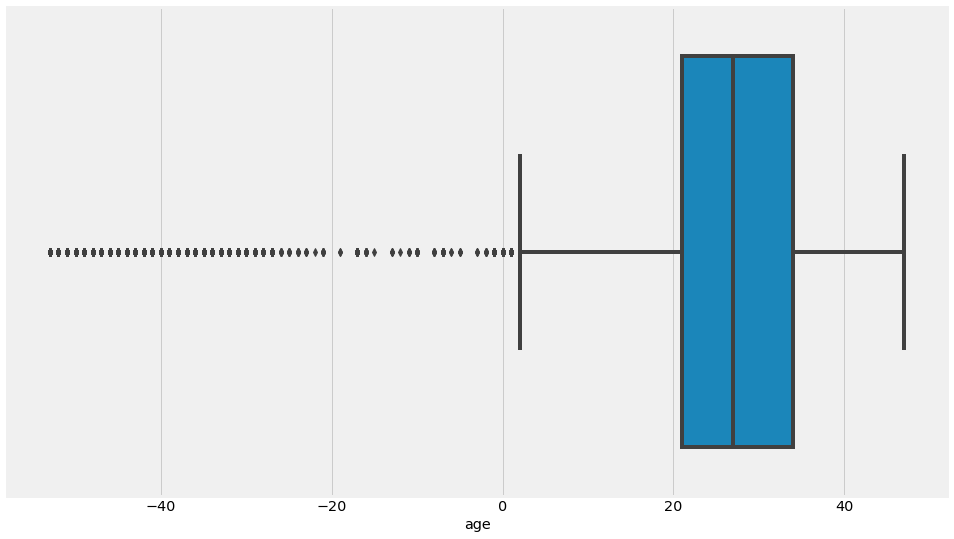

In [41]:
sns.boxplot(df.age)

There are many outliers and fake birthdates, so we will use median age instead of mean age.

### Total sales by cohort

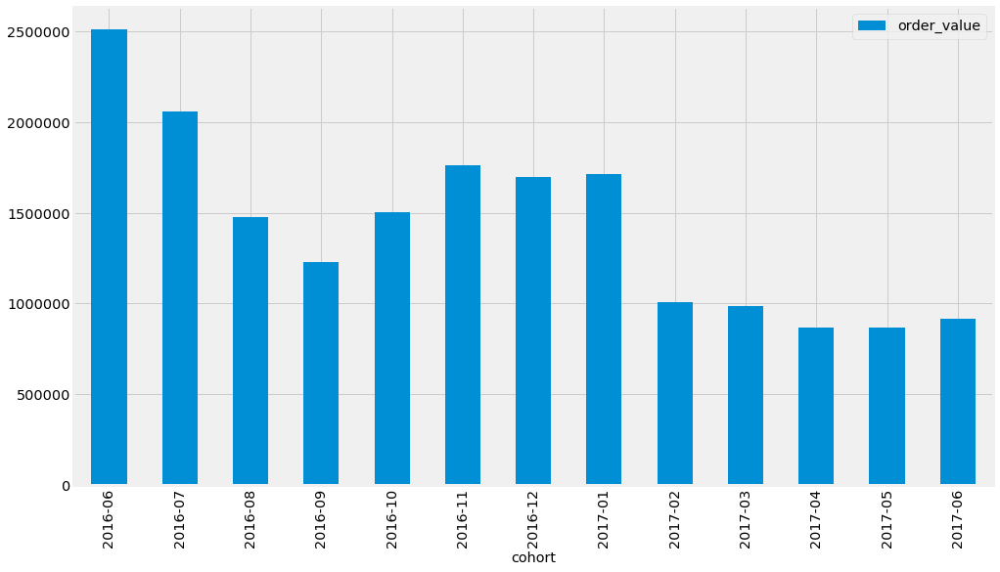

In [42]:
df.groupby('cohort').agg({'order_value': 'sum'}).plot(kind='bar')

### Average Order Value by cohort

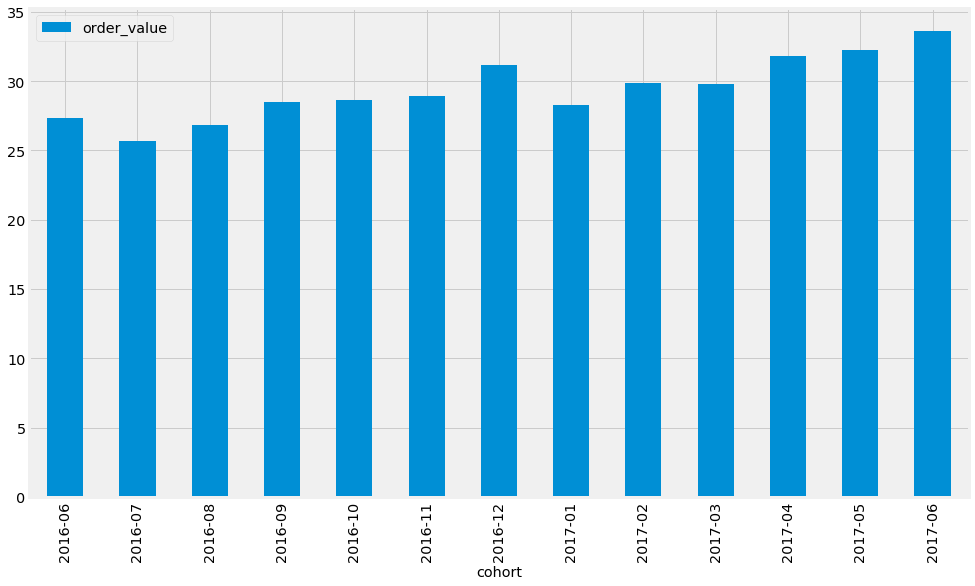

In [43]:
df.groupby('cohort').agg({'order_value': 'mean'}).plot(kind='bar')

### Number of customers in each cohort

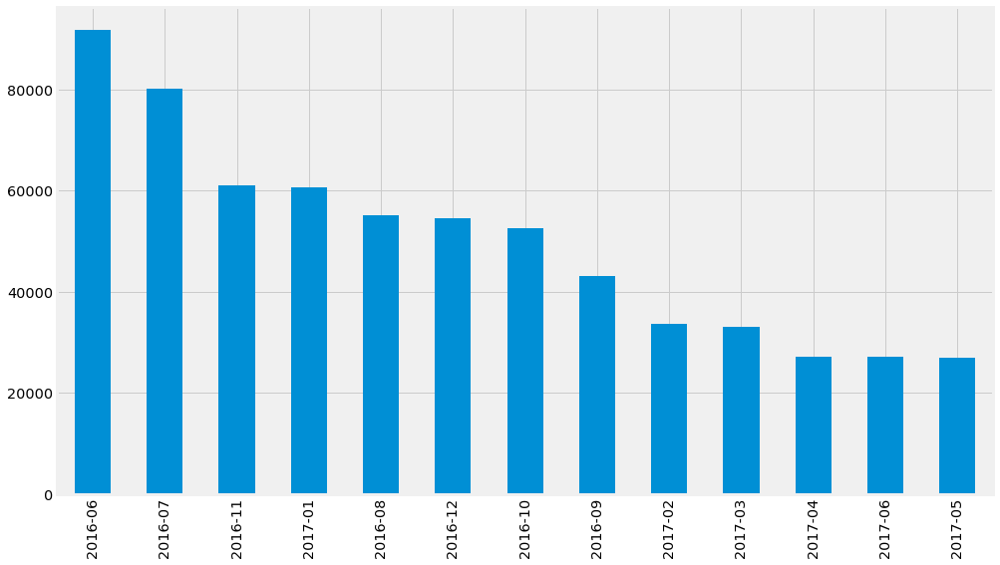

In [44]:
df.cohort.value_counts().plot(kind='bar')

### Gender make-up of customers

In [45]:
# count number of male and female customers
df.groupby('gender').zuid.count()

gender
female    518053
male      127318
Name: zuid, dtype: int64

In [46]:
females = df.groupby('gender').zuid.count()[0]
males = df.groupby('gender').zuid.count()[1]
total = df.groupby('gender').zuid.count().sum()

In [47]:
print('percentage of female customers:', "{:.2f}%".format(females/total*100))
print('percentage of male customers:', "{:.2f}%".format(males/total*100))

percentage of female customers: 80.27%
percentage of male customers: 19.73%


In [48]:
# order value by gender
df.groupby('gender').mean()

,order_value,order_hour,order_month,order_day,age
gender,,,,,
female,28.200806,14.513810,6.341735,2.941869,24.500969
male,31.029860,14.291255,6.618122,2.987535,23.903723


No significant difference in average order value by gender.

### Average order value

In [49]:
# calculate total order value for each order
df_order_value = df.groupby('order_nr').agg({'order_value': 'sum'})

In [50]:
df_order_value.describe()

,order_value
count,267262.000000
mean,69.577323
std,62.471352
min,-445.780000
25%,32.620000
50%,53.080000
75%,88.640000
max,2955.530000


In [51]:
# median order value
df_order_value.median()

order_value    53.08
dtype: float64

### How many orders were made with vouchers?

In [52]:
# for each order, count number of voucher codes used
df_voucher_code = df.groupby('order_nr').agg({'voucher_code': 'count'}).sort_values('voucher_code')

In [53]:
df_voucher_code

,voucher_code
order_nr,
201111135,0
206752655,0
206752675,0
206752725,0
206752737,0
...,...
204345491,60
203639215,60
207875941,61


In [54]:
# find number of orders that had voucher code applied
orders_with_vouchers = len(df_voucher_code[df_voucher_code.voucher_code > 0])
orders_with_vouchers

74656

In [55]:
# percentage of orders with voucher code applied
orders_with_vouchers/len(df_voucher_code)*100

27.93363815282382

### Number of voucher codes

In [56]:
# total number of voucher codes (seen from length of column)
df.voucher_code.value_counts()

ZLAPP15          16764
GRABRWF20         5927
UOBZ520           4733
RED20             4275
BFCM18            4261
                 ...  
NL5URWN              1
NL10LQF              1
NLYC82O              1
SHOPCITIE2AY3        1
IVAEE2AJJ            1
Name: voucher_code, Length: 13403, dtype: int64

### Average number of orders per voucher

In [57]:
print('on average, the number of orders generated per campaign is:')

# orders with vouchers applied / number of voucher codes
74656 / 13403

on average, the number of orders generated per campaign is:


5.570096247108856

### Top 20 vouchers

In [58]:
df.voucher_code.value_counts().head(20)

ZLAPP15        16764
GRABRWF20       5927
UOBZ520         4733
RED20           4275
BFCM18          4261
BRANDNEW        3586
SHOPDBS20       3552
SALE18          3441
UOBSHOP20       3428
UOBGSS20        2759
BESTEVER        2277
FEVERPITCH      2182
MERRYCITI20     2149
SHOP11NG        2108
PERFECT10       2027
ZBAPQZJ0        1899
MERRYCITI18     1886
FEBTASY         1820
SUMMER17        1701
JULYJOY         1532
Name: voucher_code, dtype: int64

### Worst 20 vouchers

In [59]:
df.voucher_code.value_counts().tail(20)

NLX650O          1
NLYCOFN          1
NL6PNCH          1
SHOPCITIE2GHE    1
NL15CSSH96H      1
NL537PV          1
NLPDIVO          1
NL16216          1
NL09TRB          1
NL56YCM          1
NL6973T          1
NLYY1QG          1
NL56Q8I          1
NLTL9HK          1
FEBTASY94T01     1
NL5URWN          1
NL10LQF          1
NLYC82O          1
SHOPCITIE2AY3    1
IVAEE2AJJ        1
Name: voucher_code, dtype: int64

### Which was the best month for sales?

We have data for both June 16 and June 17 sales, so let's keep the June 17 sales for analysis since the rest of the months only have sales data for one year.

In [60]:
# Filter out Jun 16 and use Jun 17 sales for month of June sales.
df_after_jun16 = df[df['order_year_mth'] != '2016-06']

In [61]:
df_after_jun16 

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day,age
1,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,27.10,apparel,Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0,NaN
2,2.13795E+14,male,NaT,2016-07,207816617,mobile,NaN,23.03,apparel,T-Shirts,2016-07-22 13:06:00,net,13:06:00,13,22/7/16,7,4,NaN
3,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0,NaN
4,2.13795E+14,male,NaT,2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,2016-07-30 11:07:00,net,11:07:00,11,30/7/16,7,5,NaN
5,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929469,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,apparel,Tops,2017-02-03 17:02:00,net,17:02:00,17,2/3/17,2,4,36.0
929470,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,apparel,Tops,2017-02-03 17:02:00,net,17:02:00,17,2/3/17,2,4,36.0
929474,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,12.93,apparel,Tops,2017-02-03 17:02:00,net,17:02:00,17,2/3/17,2,4,36.0
929475,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,10.49,apparel,Tops,2017-02-03 17:02:00,net,17:02:00,17,2/3/17,2,4,36.0


In [62]:
df_monthly = df_after_jun16.groupby('order_month', as_index=False).agg({'order_value':'sum'})
df_monthly

,order_month,order_value
0,1,1849293.74
1,2,1312807.50
2,3,1509970.31
3,4,1407255.10
4,5,1596926.82
5,6,2564238.56
6,7,1301912.72
7,8,1174114.75
8,9,1091742.78
9,10,1260014.11


#### Currency formatter

In [63]:
# truncate large currency values
def currency(x, pos):
    """The two args are the value and tick position"""
    if x >= 1e6:
        c = '${:1.1f}M'.format(x*1e-6)
    else:
        c = '${:1.0f}K'.format(x*1e-3)
    return c

curr_formatter = FuncFormatter(currency)

#### Large number formatter

In [64]:
# truncate large numbers
def number(x, pos):
    """The two args are the value and tick position"""
    if x >= 1e6:
        c = '{:1.1f}M'.format(x*1e-6)
    else:
        c = '{:1.0f}K'.format(x*1e-3)
    return c

num_formatter = FuncFormatter(number)

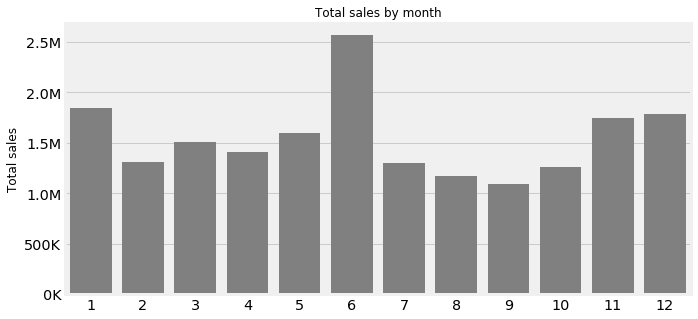

In [65]:
plt.figure(figsize=(10,5))
ax = sns.barplot(data=df_monthly, 
            x='order_month', 
            y='order_value',
            color='grey')
plt.xlabel(None)
plt.ylabel('Total sales', size='large')
plt.title('Total sales by month', size='large')
ax.yaxis.set_major_formatter(num_formatter)

### Try a rolling average for more granular trend

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 646680 entries, 1 to 929476
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              646680 non-null  object        
 1   gender            645371 non-null  object        
 2   birthday          397118 non-null  datetime64[ns]
 3   cohort            646680 non-null  object        
 4   order_nr          646680 non-null  object        
 5   environment       631877 non-null  object        
 6   voucher_code      238108 non-null  object        
 7   order_value       646680 non-null  float64       
 8   category          628265 non-null  object        
 9   sub_category      646574 non-null  object        
 10  order_created_at  646680 non-null  datetime64[ns]
 11  order_status      646680 non-null  object        
 12  order_time        646680 non-null  object        
 13  order_hour        646680 non-null  int64         
 14  orde

In [67]:
df_dateindex = df.set_index('order_created_at', drop=True)
df_dateindex

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_status,order_time,order_hour,order_year_mth,order_month,order_day,age
order_created_at,,,,,,,,,,,,,,,,,
2016-02-08 00:52:00,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,27.10,apparel,Shirts,net,00:52:00,0,2/8/16,2,0,NaN
2016-07-22 13:06:00,2.13795E+14,male,NaT,2016-07,207816617,mobile,NaN,23.03,apparel,T-Shirts,net,13:06:00,13,22/7/16,7,4,NaN
2016-02-08 00:52:00,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,net,00:52:00,0,2/8/16,2,0,NaN
2016-07-30 11:07:00,2.13795E+14,male,NaT,2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,net,11:07:00,11,30/7/16,7,5,NaN
2016-02-08 00:52:00,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,net,00:52:00,0,2/8/16,2,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-03 17:02:00,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,apparel,Tops,net,17:02:00,17,2/3/17,2,4,36.0
2017-02-03 17:02:00,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,apparel,Tops,net,17:02:00,17,2/3/17,2,4,36.0
2017-02-03 17:02:00,2.14674E+14,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,12.93,apparel,Tops,net,17:02:00,17,2/3/17,2,4,36.0


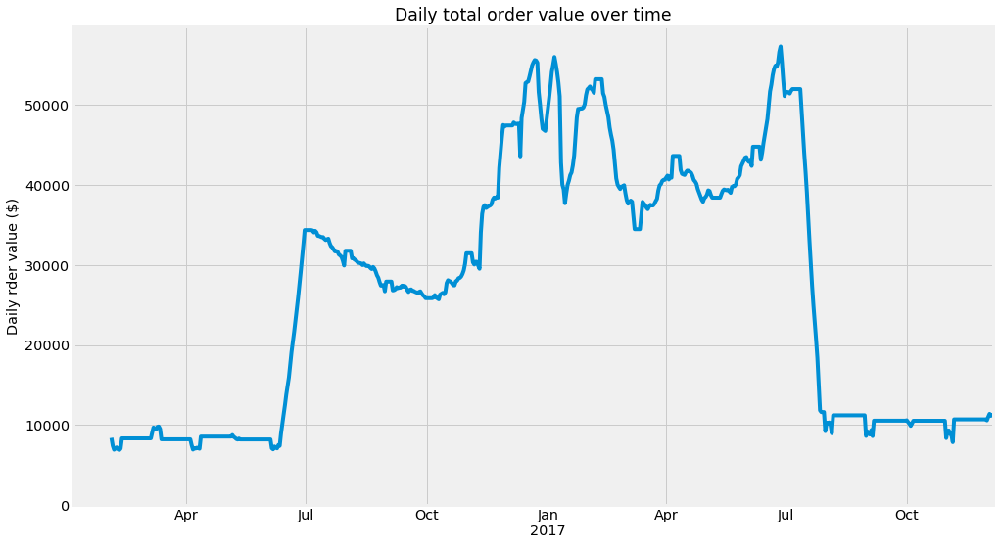

In [68]:
ax = df_dateindex.resample('D').sum().rolling(30).mean()['order_value'].plot()
plt.xlabel(None)
plt.ylabel('Daily rder value ($)')
plt.title('Daily total order value over time')
ax.set_ylim(0, None)
plt.savefig('rolling_aov.png', transparent=True, dpi=300);

### Which day of the week receives the most orders?

In [69]:
df_dayweek = df.groupby('order_day', as_index=False).order_nr.count().sort_values('order_day')
df_dayweek.T

,0,1,2,3,4,5,6
order_day,0,1,2,3,4,5,6
order_nr,101385,95225,88185,88868,90630,86808,95579


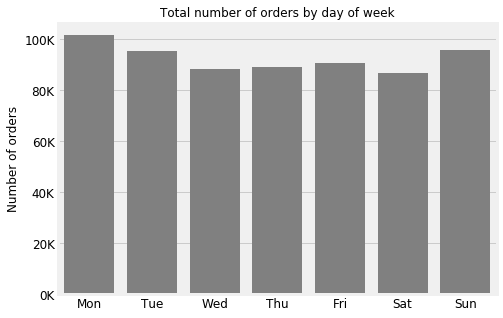

In [70]:
plt.figure(figsize=(7,5))
ax = sns.barplot(data=df_dayweek, 
            x='order_day', 
            y='order_nr',
            color='grey')
plt.xlabel(None)
plt.ylabel('Number of orders', size='large')
plt.title('Total number of orders by day of week', size='large')
bars = ('Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun')
y_pos = np.arange(len(bars))
plt.xticks(y_pos, bars, size='large')
plt.yticks(size='large')
ax.yaxis.set_major_formatter(num_formatter)
plt.savefig('order_by_weekday.png', transparent=True, dpi=300, pad_inches=0.1);

### Orders by hour of day

In [71]:
# get the number of unique orders in each hour
df_hour = df.groupby('order_hour').agg({'order_nr': pd.Series.nunique}).reset_index()
df_hour.T

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
order_hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
order_nr,14681,8023,4174,2238,1389,1432,1966,3426,5832,9159,...,14879,14983,15161,14119,12724,11604,14869,20009,22342,21871


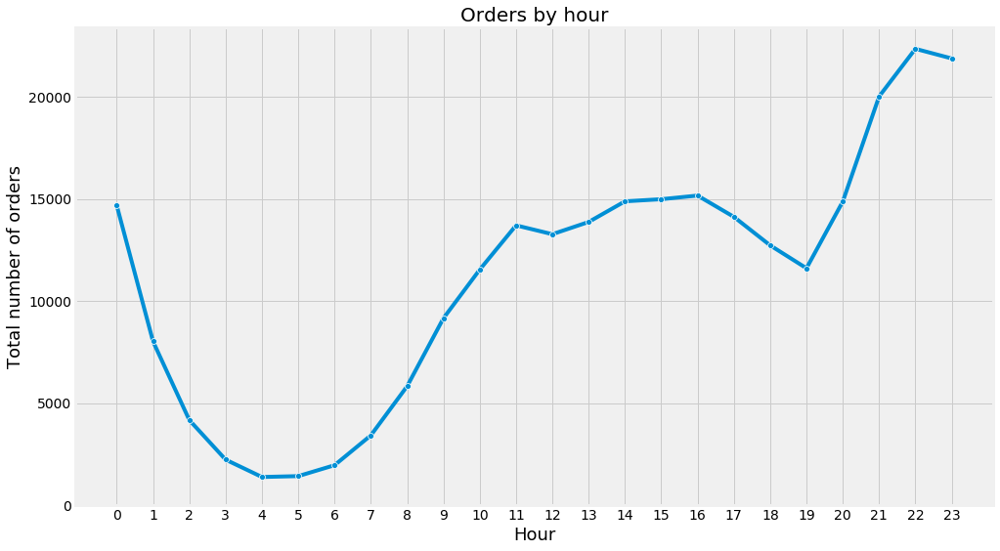

In [72]:
ax = sns.lineplot(data=df_hour, x='order_hour', y='order_nr', marker='o')
x = df_hour.order_hour   # show all the xticks in graph
plt.xticks(x, size=14)
plt.ylim(0, None)
plt.yticks(size=14)
plt.xlabel('Hour', size=18)
plt.ylabel('Total number of orders', size=18)
plt.title('Orders by hour', size=20);

### Which environment did the most number of sales come from?

In [73]:
# find number of unique orders made in each environment
df_env = df.groupby('environment', as_index=False).agg({'order_nr': pd.Series.nunique})

In [74]:
df_env

,environment,order_nr
0,desktop,83737
1,mobile,165210
2,tablet,6174


In [75]:
df_env.columns= ['environment', 'total orders']

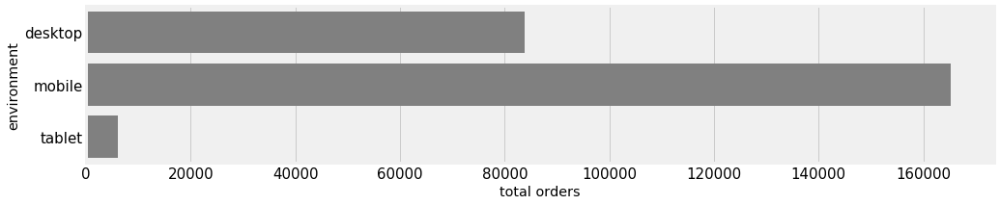

In [76]:
plt.figure(figsize=(15, 3))
sns.barplot(data=df_env, x='total orders', y='environment', color='grey')
plt.yticks(size=15)
plt.xticks(size=15);

Orders made on mobile app are almost twice of tablet and desktop orders combined.

### Which category is most popular?

In [77]:
df_cat = df.groupby('category', as_index=False).agg({'order_value': 'sum'}).sort_values('order_value', ascending=False)

In [78]:
df_cat

,category,order_value
1,apparel,8.784352e+06
0,accessories,2.974620e+06
3,footwear,2.957283e+06
5,sports,1.507744e+06
6,traditional,1.486579e+06
2,beauty,4.174349e+05
4,kids,3.064810e+03


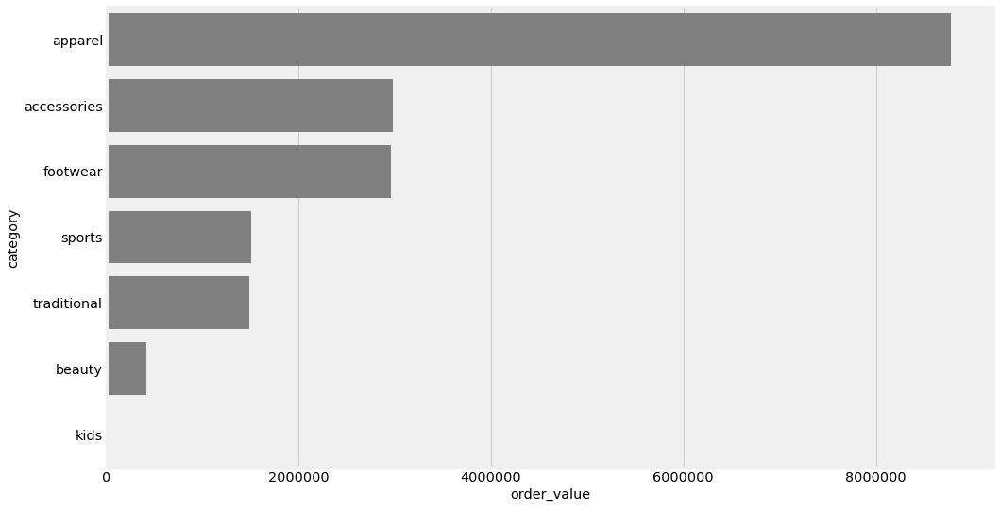

In [79]:
sns.barplot(data=df_cat, 
            x='order_value', 
            y='category', 
            color='grey', 
            saturation=.5)


### Which sub-category is most popular?

In [80]:
df_subcat = df.groupby('sub_category', as_index=False).agg({'order_value': 'sum'}).sort_values('order_value', ascending=False)

In [81]:
df_subcat = df_subcat.head(20)
df_subcat

,sub_category,order_value
12,Dresses,3.419438e+06
76,Tops,1.321077e+06
80,Traditional Dresses,9.233018e+05
0,Backpacks,7.275165e+05
86,Watches,6.962357e+05
54,Sneakers,6.396705e+05
73,T-Shirts,5.996371e+05
22,Heels,5.820643e+05
45,Sandals & Flip Flops,5.485055e+05
61,Sports Lifestyle Shoes,5.168263e+05


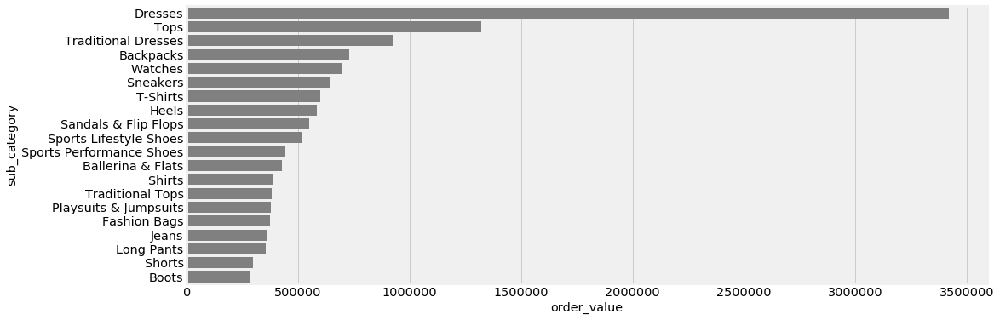

In [82]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df_subcat, 
            x='order_value', 
            y='sub_category', 
            color='grey', 
            saturation=.5);

# RFM analysis

### Formulas

- Recency: **number of days** between present date and date of last purchase for each customer.<br>
- Frequency: **number of orders** for each customer.<br>
- Monetary: **total sum of order value** for each customer.

There are three basic steps to RFM analysis:
1. Sort all customers in ascending order based on Recency, Frequency and Monetary Value.
2. Split customers into 4 or 5 for each factor.
3. Combine factors to group customers into RFM segments for targeted marketing.

In [84]:
# Timeframe of the data
print('We will do our RFM analysis from {} to {}.'.format(df['order_created_at'].min(),
                                    df['order_created_at'].max()))

We will do our RFM analysis from 2016-01-06 00:00:00 to 2017-12-06 23:57:00.


## Find the last purchase date of each customer

In [85]:
df.head()

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day,age
1,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,27.10,apparel,Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0,NaN
2,2.13795E+14,male,NaT,2016-07,207816617,mobile,NaN,23.03,apparel,T-Shirts,2016-07-22 13:06:00,net,13:06:00,13,22/7/16,7,4,NaN
3,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0,NaN
4,2.13795E+14,male,NaT,2016-07,508943717,NaN,NaN,14.02,apparel,Shorts,2016-07-30 11:07:00,net,11:07:00,11,30/7/16,7,5,NaN
5,2.13795E+14,male,NaT,2016-07,205926117,mobile,NaN,13.93,apparel,T-Shirts,2016-02-08 00:52:00,net,00:52:00,0,2/8/16,2,0,NaN


In [86]:
# Group by customer ID and retrieve last date of purchase
recency_df = df.groupby(by='zuid', as_index=False)['order_created_at'].max()
recency_df.columns = ['zuid','last_purchase_date']
recency_df.head()

,zuid,last_purchase_date
0,2.13795E+14,2017-12-06 23:55:00
1,2.13796E+14,2017-11-01 21:43:00
2,2.13797E+14,2017-12-03 17:26:00
3,2.13798E+14,2017-06-19 14:50:00
4,2.13799E+14,2017-12-04 19:17:00


To simulate an analysis in real time, we can set the CURRENT date at one day after the last purchase.<br> 
This date will be used as a reference to calculate the Recency score.

In [87]:
CURRENT = df['order_created_at'].max() + timedelta(days=1)
CURRENT

Timestamp('2017-12-07 23:57:00')

In [88]:
rfm = df.groupby('zuid').agg({'order_created_at': lambda date: (CURRENT - date.max()).days, # days since last order
                                        'order_nr': lambda num: len(num), # number of orders made
                                        'order_value': lambda value: value.sum()}) # sum of all order values

In [89]:
rfm.columns = ['recency', 'frequency', 'monetary']

In [90]:
rfm

,recency,frequency,monetary
zuid,,,
2.13795E+14,1,27056,805751.03
2.13796E+14,36,23,336.31
2.13797E+14,4,75,1577.63
2.13798E+14,171,50,2621.52
2.13799E+14,3,40,1064.96
...,...,...,...
2.14985E+14,162,524,17832.57
2.14986E+14,163,68,2347.60
2.1498E+14,163,595,22613.19


## Histogram based on Frequency

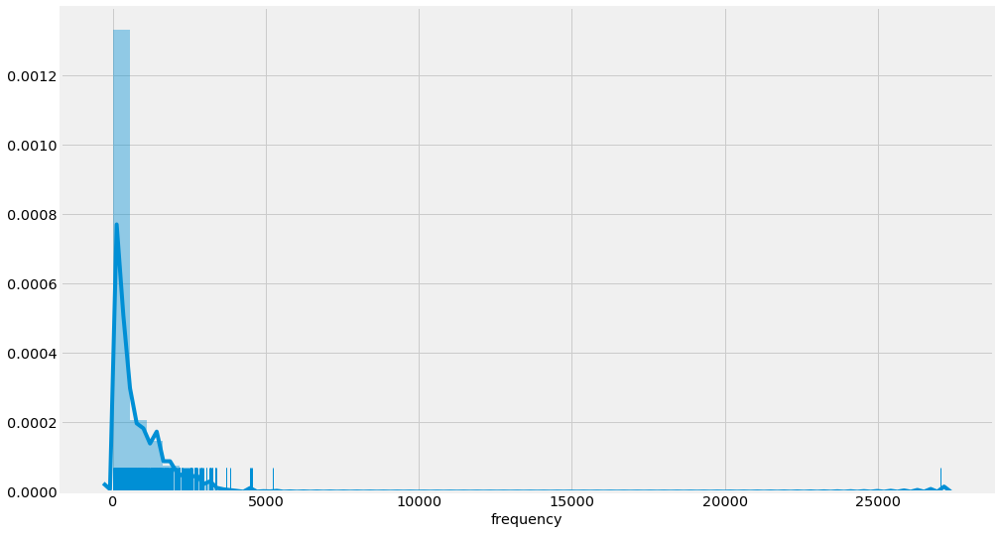

In [91]:
sns.distplot(rfm.frequency, rug=True);

### Inspect distribution of frequency

In [92]:
freq_list = []
cust_count_list = []
cust_count_pct_list = []

for i in range(1,6):
    cust_count = rfm[rfm['frequency'] == i]['frequency'].count()
    cust_count_pct = cust_count/len(rfm)
    
    freq_list.append(i)
    cust_count_list.append(cust_count)
    cust_count_pct_list.append(cust_count_pct)
    
    print(cust_count, 'customers purchased', i, 'time(s)')
    print("{:.2f}%".format(cust_count_pct*100), 'customers purchased', i, 'time(s)\n')

0 customers purchased 1 time(s)
0.00% customers purchased 1 time(s)

0 customers purchased 2 time(s)
0.00% customers purchased 2 time(s)

0 customers purchased 3 time(s)
0.00% customers purchased 3 time(s)

0 customers purchased 4 time(s)
0.00% customers purchased 4 time(s)

0 customers purchased 5 time(s)
0.00% customers purchased 5 time(s)



In [93]:
df_freq = pd.DataFrame(list(zip(freq_list, cust_count_list, cust_count_pct_list)), 
               columns =['purchase_count', 'cust_count', 'cust_pct']) 
df_freq

,purchase_count,cust_count,cust_pct
0,1,0,0.0
1,2,0,0.0
2,3,0,0.0
3,4,0,0.0
4,5,0,0.0


In [94]:
df_freq.cust_pct.cumsum()

0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: cust_pct, dtype: float64

## Histogram based on Recency

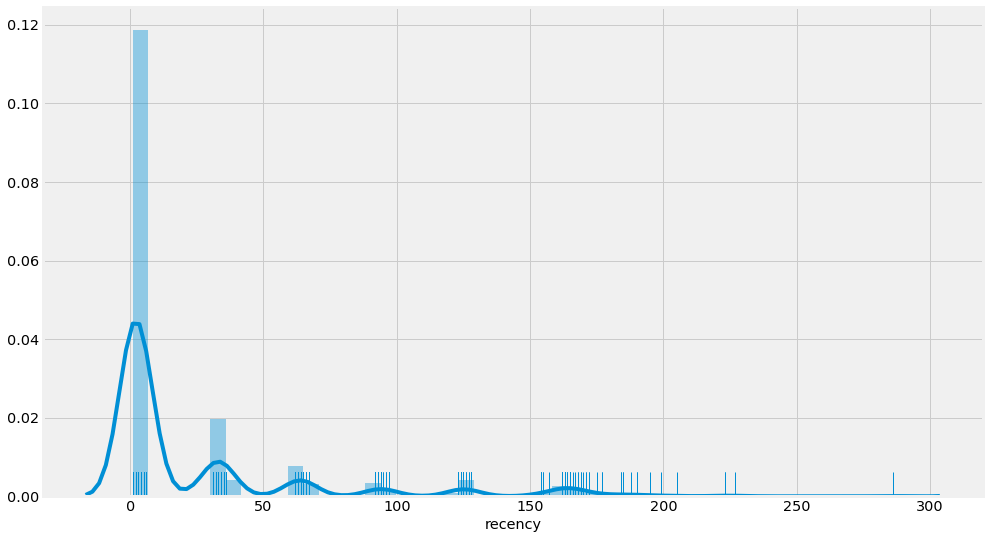

In [95]:
sns.distplot(rfm.recency, rug=True);

In [96]:
rfm.recency.quantile([.2, .4, .6, .8]).to_list()

[1.0, 2.0, 5.0, 35.0]

## Histogram based on Monetary value

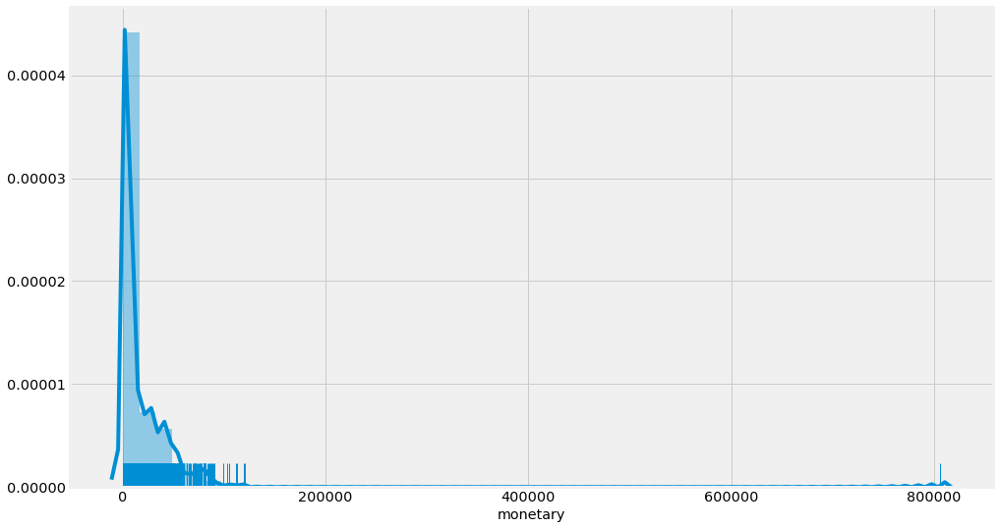

In [97]:
sns.distplot(rfm.monetary, rug=True);

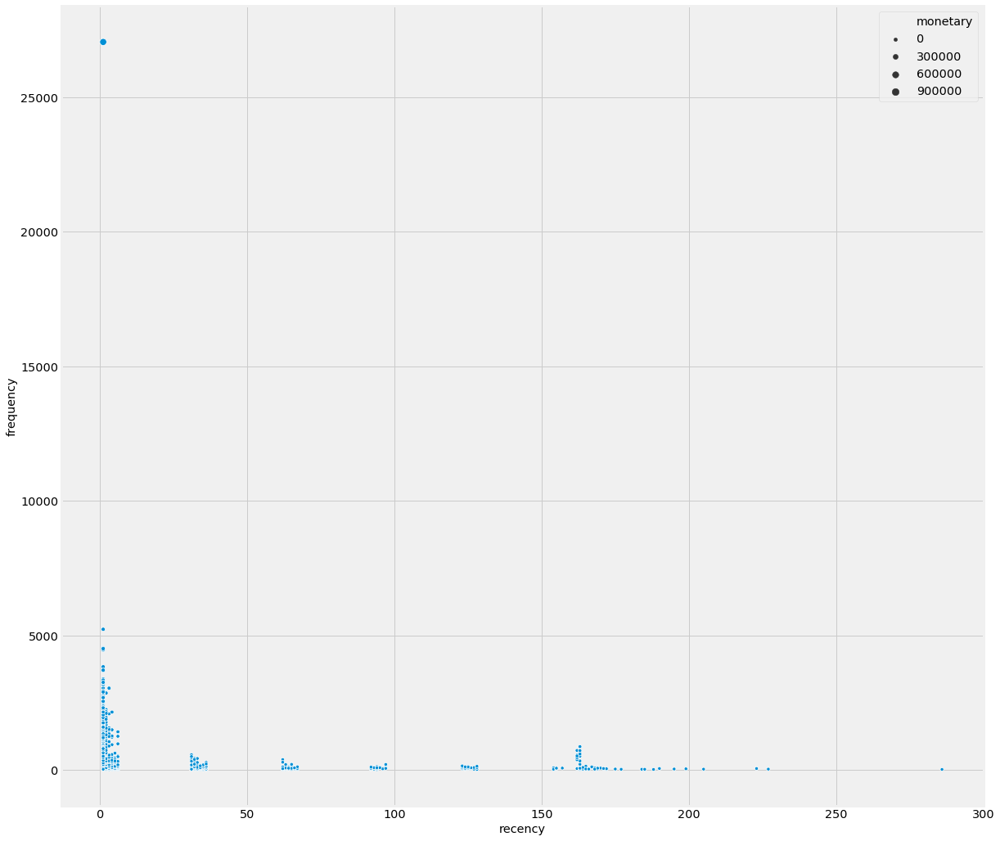

In [98]:
plt.figure(figsize=(18, 18))
sns.scatterplot(data=rfm, 
                x='recency', 
                y='frequency',
                size='monetary')

## Computing Quantile of RFM values

    
The common practice is to divide the customers into 4 or 5 bins. We will go with 5 bins here for more granular analysis and also because the time frame is slightly longer than the conventional one-year timeframe for RFM analysis.

In [99]:
quintiles = rfm.quantile([.2, .4, .6, .8]).to_dict()
pd.DataFrame(quintiles)

,recency,frequency,monetary
0.2,1.0,74.0,2126.512
0.4,2.0,118.4,3422.632
0.6,5.0,245.2,6811.280
0.8,35.0,905.0,27733.912


In [100]:
# For Recency, the label is inverse that of Frequency and Monetary.
# This is because a smaller value for Recency is better while larger value for Frequency and Monetary are better.

def r_score(x):
    if x <= quintiles['recency'][.2]:
        return 5
    elif x <= quintiles['recency'][.4]:
        return 4
    elif x <= quintiles['recency'][.6]:
        return 3
    elif x <= quintiles['recency'][.8]:
        return 2
    else:
        return 1
    
def fm_score(x, column):
    if x <= quintiles[column][.2]:
        return 1
    elif x <= quintiles[column][.4]:
        return 2
    elif x <= quintiles[column][.6]:
        return 3
    elif x <= quintiles[column][.8]:
        return 4
    else:
        return 5

In [101]:
rfm['R'] = rfm['recency'].apply(lambda x: r_score(x))
rfm['F'] = rfm['frequency'].apply(lambda x: fm_score(x, 'frequency'))
rfm['M'] = rfm['monetary'].apply(lambda x: fm_score(x, 'monetary'))

In [102]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1192 entries, 2.13795E+14 to 2.14E+14
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   recency    1192 non-null   int64  
 1   frequency  1192 non-null   int64  
 2   monetary   1192 non-null   float64
 3   R          1192 non-null   int64  
 4   F          1192 non-null   int64  
 5   M          1192 non-null   int64  
dtypes: float64(1), int64(5)
memory usage: 105.2+ KB


In [103]:
rfm['RFM_score'] = rfm['R'].apply(str) + rfm['F'].apply(str) + rfm['M'].apply(str)

In [104]:
rfm # 5 is the best score

,recency,frequency,monetary,R,F,M,RFM_score
zuid,,,,,,,
2.13795E+14,1,27056,805751.03,5,5,5,555
2.13796E+14,36,23,336.31,1,1,1,111
2.13797E+14,4,75,1577.63,3,2,1,321
2.13798E+14,171,50,2621.52,1,1,2,112
2.13799E+14,3,40,1064.96,3,1,1,311
...,...,...,...,...,...,...,...
2.14985E+14,162,524,17832.57,1,4,4,144
2.14986E+14,163,68,2347.60,1,1,2,112
2.1498E+14,163,595,22613.19,1,4,4,144


### Divide customers into segments based on Recency and Frequency

In [105]:
segt_map = {
    r'[1-2][1-2]': 'Hibernating',
    r'[1-2][3-4]': 'Churn risk',
    r'[1-2]5': 'Cannot lose them',
    r'3[1-2]': 'About to sleep',
    r'33': 'Require attention',
    r'[3-4][4-5]': 'Loyal customers',
    r'41': 'Recent customer',
    r'51': 'New customer',
    r'[4-5][2-3]': 'Potential loyalists',
    r'5[4-5]': 'Champions'
}

rfm['Segment'] = rfm['R'].map(str) + rfm['F'].map(str)
rfm['Segment'] = rfm['Segment'].replace(segt_map, regex=True)
rfm.head()

,recency,frequency,monetary,R,F,M,RFM_score,Segment
zuid,,,,,,,,
2.13795E+14,1,27056,805751.03,5,5,5,555,Champions
2.13796E+14,36,23,336.31,1,1,1,111,Hibernating
2.13797E+14,4,75,1577.63,3,2,1,321,About to sleep
2.13798E+14,171,50,2621.52,1,1,2,112,Hibernating
2.13799E+14,3,40,1064.96,3,1,1,311,About to sleep


In [106]:
pd.DataFrame(rfm.Segment.value_counts())

,Segment
Champions,325
Hibernating,293
Churn risk,133
Potential loyalists,120
Loyal customers,114
About to sleep,91
Require attention,72
New customer,33
Recent customer,8
Cannot lose them,3
